# Problem Statement & Introduction
---

West Nile virus (WNV) is the leading mosquito-borne disease in the United States . It is primarily transmitted by mosquitoes, which become infected when they feed on birds, WNV's primary hosts. Infected mosquitos then spread WNV to people and another animals by biting them. Cases of WNV occur during mosquito season, which starts in the summer and continues through fall.

While WNV is not extremely severe or harmful in its effects and only about 1 in 5 people are infected develop West Nile fever and other symptoms, about 1 out of every 150 infected develop a serious and sometimes fatal illness.

In view of the recent outbreak of WNV in Chicago, the Chicago Department of Public Health (CDPH) has set up a surveillance and control system to trap mosquitos and test for the presence of WNV. The goal of this project is to use these surveillance data to predict the occurrence of WNV given time, location, and mosquito species. Findings from this project will guide and inform decisions on where and when to deploy pesticides throughout the city, to maximise pesticide effectiveness and minimise spending.

This notebook explores the train and weather dataset. \
It also describes what have been done to the dataset in prepration for merging and use for modelling. 

## Import Libraries
---

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
plt.rcParams.update({'font.size':20})
import datetime
import seaborn as sns

from scipy.stats import ttest_ind

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

sns.set_theme();

## Import Data Files and General Observations
---

In [ ]:
weather_df = pd.read_csv('../assets/weather.csv')

In [ ]:
train_df = pd.read_csv('../assets/train.csv')

In [ ]:
test_df = pd.read_csv('../assets/test.csv')
test_df.columns = test_df.columns.str.lower()

In [ ]:
weather_df.head()

,Station,Date,Tmax,Tmin,Tavg,Depart,DewPoint,WetBulb,Heat,Cool,...,CodeSum,Depth,Water1,SnowFall,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed
0,1,2007-05-01,83,50,67,14,51,56,0,2,...,,0,M,0.0,0.00,29.10,29.82,1.7,27,9.2
1,2,2007-05-01,84,52,68,M,51,57,0,3,...,,M,M,M,0.00,29.18,29.82,2.7,25,9.6
2,1,2007-05-02,59,42,51,-3,42,47,14,0,...,BR,0,M,0.0,0.00,29.38,30.09,13.0,4,13.4
3,2,2007-05-02,60,43,52,M,42,47,13,0,...,BR HZ,M,M,M,0.00,29.44,30.08,13.3,2,13.4
4,1,2007-05-03,66,46,56,2,40,48,9,0,...,,0,M,0.0,0.00,29.39,30.12,11.7,7,11.9


In [ ]:
train_df.head()

,Date,Address,Species,Block,Street,Trap,AddressNumberAndStreet,Latitude,Longitude,AddressAccuracy,NumMosquitos,WnvPresent
0,2007-05-29,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX PIPIENS/RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.954690,-87.800991,9,1,0
1,2007-05-29,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.954690,-87.800991,9,1,0
2,2007-05-29,"6200 North Mandell Avenue, Chicago, IL 60646, USA",CULEX RESTUANS,62,N MANDELL AVE,T007,"6200 N MANDELL AVE, Chicago, IL",41.994991,-87.769279,9,1,0
3,2007-05-29,"7900 West Foster Avenue, Chicago, IL 60656, USA",CULEX PIPIENS/RESTUANS,79,W FOSTER AVE,T015,"7900 W FOSTER AVE, Chicago, IL",41.974089,-87.824812,8,1,0
4,2007-05-29,"7900 West Foster Avenue, Chicago, IL 60656, USA",CULEX RESTUANS,79,W FOSTER AVE,T015,"7900 W FOSTER AVE, Chicago, IL",41.974089,-87.824812,8,4,0


Update columns header for both train_df and weather_df to lowercase

In [ ]:
weather_df.columns = weather_df.columns.str.lower()

In [ ]:
train_df.columns = train_df.columns.str.lower()

Convert date to datetime format and create new columns for year, month, day in both dataframes

In [ ]:
#convert date to datetime for weather_df
weather_df['date'] = pd.to_datetime(weather_df['date'])
#create new columns for year month, weekday,dayname,day,
weather_df['year'] = weather_df['date'].dt.year
weather_df['month'] = weather_df['date'].dt.month
weather_df['day'] = weather_df['date'].dt.day
weather_df['weekday'] = weather_df['date'].dt.weekday
weather_df['day_name'] = weather_df['date'].dt.day_name()
weather_df['week'] = weather_df['date'].dt.isocalendar().week

In [ ]:
#convert date to datetime for train_df
train_df['date'] = pd.to_datetime(train_df['date'])
train_df['year'] = train_df['date'].dt.year
train_df['month'] = train_df['date'].dt.month
train_df['day'] = train_df['date'].dt.day
train_df['weekday'] = train_df['date'].dt.weekday
train_df['day_name'] = train_df['date'].dt.day_name()
train_df['week'] = train_df['date'].dt.isocalendar().week

In [ ]:
weather_df.head()

,station,date,tmax,tmin,tavg,depart,dewpoint,wetbulb,heat,cool,...,sealevel,resultspeed,resultdir,avgspeed,year,month,day,weekday,day_name,week
0,1,2007-05-01,83,50,67,14,51,56,0,2,...,29.82,1.7,27,9.2,2007,5,1,1,Tuesday,18
1,2,2007-05-01,84,52,68,M,51,57,0,3,...,29.82,2.7,25,9.6,2007,5,1,1,Tuesday,18
2,1,2007-05-02,59,42,51,-3,42,47,14,0,...,30.09,13.0,4,13.4,2007,5,2,2,Wednesday,18
3,2,2007-05-02,60,43,52,M,42,47,13,0,...,30.08,13.3,2,13.4,2007,5,2,2,Wednesday,18
4,1,2007-05-03,66,46,56,2,40,48,9,0,...,30.12,11.7,7,11.9,2007,5,3,3,Thursday,18


In [ ]:
train_df.head()

,date,address,species,block,street,trap,addressnumberandstreet,latitude,longitude,addressaccuracy,nummosquitos,wnvpresent,year,month,day,weekday,day_name,week
0,2007-05-29,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX PIPIENS/RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.954690,-87.800991,9,1,0,2007,5,29,1,Tuesday,22
1,2007-05-29,"4100 North Oak Park Avenue, Chicago, IL 60634,...",CULEX RESTUANS,41,N OAK PARK AVE,T002,"4100 N OAK PARK AVE, Chicago, IL",41.954690,-87.800991,9,1,0,2007,5,29,1,Tuesday,22
2,2007-05-29,"6200 North Mandell Avenue, Chicago, IL 60646, USA",CULEX RESTUANS,62,N MANDELL AVE,T007,"6200 N MANDELL AVE, Chicago, IL",41.994991,-87.769279,9,1,0,2007,5,29,1,Tuesday,22
3,2007-05-29,"7900 West Foster Avenue, Chicago, IL 60656, USA",CULEX PIPIENS/RESTUANS,79,W FOSTER AVE,T015,"7900 W FOSTER AVE, Chicago, IL",41.974089,-87.824812,8,1,0,2007,5,29,1,Tuesday,22
4,2007-05-29,"7900 West Foster Avenue, Chicago, IL 60656, USA",CULEX RESTUANS,79,W FOSTER AVE,T015,"7900 W FOSTER AVE, Chicago, IL",41.974089,-87.824812,8,4,0,2007,5,29,1,Tuesday,22


In [ ]:
def simple_eda(df):
    print('Rows: ',df.shape[0], '  Columns: ', df.shape[1])
    print('Total Null Rows: ', df.isnull().sum().sum())
    print('% Total Null Rows: ', round(df.isnull().sum().sum() / train_df.shape[0]* 100,2))
    print('Total Rows Duplicated: ', train_df.duplicated(keep=False).sum())
    print('% Total Rows Duplicated: ',round(
        (train_df[train_df.duplicated(keep=False)].shape[0]/ train_df.shape[0]) * 100,2))
    print('----')
    print(df.dtypes)

In [ ]:
simple_eda(weather_df)

Rows:  2944   Columns:  28
Total Null Rows:  0
% Total Null Rows:  0.0
Total Rows Duplicated:  1062
% Total Rows Duplicated:  10.11
----
station                 int64
date           datetime64[ns]
tmax                    int64
tmin                    int64
tavg                   object
depart                 object
dewpoint                int64
wetbulb                object
heat                   object
cool                   object
sunrise                object
sunset                 object
codesum                object
depth                  object
water1                 object
snowfall               object
preciptotal            object
stnpressure            object
sealevel               object
resultspeed           float64
resultdir               int64
avgspeed               object
year                    int64
month                   int64
day                     int64
weekday                 int64
day_name               object
week                   UInt32
dtype: object


No rull rows for weather found but there are duplicated rows found. However, in the data dictionary, it is indicated that missing value is marked as 'M'. \
However, in the data dictionary, it is indicated that missing value is marked as 'M'. \
This explains why there are more columns that could be in integer are in object types.\

Duplication occurs due to the new rows created based on batch 50 mosquitoes .

In [ ]:
for i in weather_df.columns:
  if weather_df[i].dtype == object:
    print(weather_df[i].value_counts())
#observe the datas in the columns that are object type

73    138
70    117
77    117
75    110
71    109
74    107
72    104
69    103
78    102
76    100
68     99
79     98
66     93
67     89
61     88
64     86
65     84
80     84
63     81
57     67
62     66
60     61
50     57
81     55
53     49
58     49
82     48
54     48
55     48
52     46
56     46
59     45
51     36
83     34
49     29
45     28
46     24
47     24
84     21
44     19
48     17
86     16
85     16
42     15
43     12
M      11
87      9
41      7
40      5
88      4
39      4
91      4
89      4
36      2
38      2
90      2
37      2
93      1
94      1
92      1
Name: tavg, dtype: int64
M      1472
 2       93
-1       84
-2       80
 5       77
 7       76
 1       76
 3       75
 0       74
-3       72
 4       71
 6       67
 8       59
-5       57
-4       56
-6       50
 9       47
10       46
-8       43
-7       30
12       28
11       28
-9       25
13       23
14       22
-10      22
15       15
16       12
-11      10
-12       8
17        7
18 

Only codesum column has some string information.\
Rest of columns have M as missing data,* ,-, or T as trace amount.

In [ ]:
#convert objects to numeric data
weather_df.iloc[:,2:12] = weather_df.iloc[:,2:12].apply(
    lambda x : pd.to_numeric(x, errors='coerce'))
weather_df.iloc[:,13:16] = weather_df.iloc[:,13:16].apply(
    lambda x : pd.to_numeric(x, errors='coerce'))
weather_df.iloc[:,17:22] = weather_df.iloc[:,17:22].apply(
    lambda x : pd.to_numeric(x, errors='coerce'))

Convert objects to numeric data apart from codesum column.\
Return null for rest of non-numeric missing and fill as 0.\
With the exception for preciptotal, will retain the T (trace) and put M to null.



In [ ]:
simple_eda(weather_df)

Rows:  2944   Columns:  28
Total Null Rows:  10369
% Total Null Rows:  98.7
Total Rows Duplicated:  1062
% Total Rows Duplicated:  10.11
----
station                 int64
date           datetime64[ns]
tmax                    int64
tmin                    int64
tavg                  float64
depart                float64
dewpoint                int64
wetbulb               float64
heat                  float64
cool                  float64
sunrise               float64
sunset                float64
codesum                object
depth                 float64
water1                float64
snowfall              float64
preciptotal            object
stnpressure           float64
sealevel              float64
resultspeed           float64
resultdir               int64
avgspeed              float64
year                    int64
month                   int64
day                     int64
weekday                 int64
day_name               object
week                   UInt32
dtype: object


Managed to convert most of the columns to integer. Total of 10369 null rows found after converting.

In [ ]:
simple_eda(train_df)  #see overall info about train_df data 

Rows:  10506   Columns:  18
Total Null Rows:  0
% Total Null Rows:  0.0
Total Rows Duplicated:  1062
% Total Rows Duplicated:  10.11
----
date                      datetime64[ns]
address                           object
species                           object
block                              int64
street                            object
trap                              object
addressnumberandstreet            object
latitude                         float64
longitude                        float64
addressaccuracy                    int64
nummosquitos                       int64
wnvpresent                         int64
year                               int64
month                              int64
day                                int64
weekday                            int64
day_name                          object
week                              UInt32
dtype: object


No rull rows in train_df found but there are duplicated rows found. 

### Dealing with columns with null values 

In [ ]:
weather_df.isnull().sum()

station           0
date              0
tmax              0
tmin              0
tavg             11
depart         1472
dewpoint          0
wetbulb           4
heat             11
cool             11
sunrise        1472
sunset         1472
codesum           0
depth          1472
water1         2944
snowfall       1484
preciptotal       0
stnpressure       4
sealevel          9
resultspeed       0
resultdir         0
avgspeed          3
year              0
month             0
day               0
weekday           0
day_name          0
week              0
dtype: int64

Total of 11 columns that have null values.

6 out of 11 columns has more than 50% null values.  These columns will be dropped.

For tavg, we could possibly impute based on the other station tavg as the average temperatures tend to be close.\
For wetbulb, we could derive based on the average temperature and dewpoint, as well as taking reference from the other station temperatures.\
For heat and cool, we should be able to derive based on the formula as long as we have the average temperature.\
For station pressure, these are pretty consistent and we could impute based on the average temperature, dewpoint and wetbulb.\
For sealevel pressure, this column is probably redundant and can be dropped since there is already a station pressure and the difference is small.\
For average speed, we could reference from the other station's data.

Lets drop the columns with significant number of null.

In [ ]:
weather_df.drop(columns = ['depart', 'sunrise', 'sunset', 'depth', 'water1', 'snowfall'],
                inplace=True, axis = 1)
#dropping the columns with significant number of nulls and not useful for the model

In [ ]:
weather_df.head()

,station,date,tmax,tmin,tavg,dewpoint,wetbulb,heat,cool,codesum,...,sealevel,resultspeed,resultdir,avgspeed,year,month,day,weekday,day_name,week
0,1,2007-05-01,83,50,67.0,51,56.0,0.0,2.0,,...,29.82,1.7,27,9.2,2007,5,1,1,Tuesday,18
1,2,2007-05-01,84,52,68.0,51,57.0,0.0,3.0,,...,29.82,2.7,25,9.6,2007,5,1,1,Tuesday,18
2,1,2007-05-02,59,42,51.0,42,47.0,14.0,0.0,BR,...,30.09,13.0,4,13.4,2007,5,2,2,Wednesday,18
3,2,2007-05-02,60,43,52.0,42,47.0,13.0,0.0,BR HZ,...,30.08,13.3,2,13.4,2007,5,2,2,Wednesday,18
4,1,2007-05-03,66,46,56.0,40,48.0,9.0,0.0,,...,30.12,11.7,7,11.9,2007,5,3,3,Thursday,18


In [ ]:
weather_df.isnull().sum()

station         0
date            0
tmax            0
tmin            0
tavg           11
dewpoint        0
wetbulb         4
heat           11
cool           11
codesum         0
preciptotal     0
stnpressure     4
sealevel        9
resultspeed     0
resultdir       0
avgspeed        3
year            0
month           0
day             0
weekday         0
day_name        0
week            0
dtype: int64

### Impute tavg
Filter out the missing values in tavg for imputation.

In [ ]:
missing_tavg_idx = weather_df[weather_df['tavg'].isnull()].index 
#getting the index where tavg is null
weather_df[weather_df['tavg'].isnull()] #to view columns where tavg is null

,station,date,tmax,tmin,tavg,dewpoint,wetbulb,heat,cool,codesum,...,sealevel,resultspeed,resultdir,avgspeed,year,month,day,weekday,day_name,week
7,2,2007-05-04,78,51,NaN,42,50.0,NaN,NaN,,...,30.04,10.1,7,10.4,2007,5,4,4,Friday,18
505,2,2008-07-08,86,46,NaN,68,71.0,NaN,NaN,TS RA,...,29.80,7.4,24,8.3,2008,7,8,1,Tuesday,28
675,2,2008-10-01,62,46,NaN,41,47.0,NaN,NaN,,...,29.96,10.9,33,11.0,2008,10,1,2,Wednesday,40
1637,2,2011-07-22,100,71,NaN,70,74.0,NaN,NaN,TS TSRA BR,...,29.86,3.8,10,8.2,2011,7,22,4,Friday,29
2067,2,2012-08-22,84,72,NaN,51,61.0,NaN,NaN,,...,NaN,4.7,19,NaN,2012,8,22,2,Wednesday,34
2211,2,2013-05-02,71,42,NaN,39,45.0,NaN,NaN,,...,30.17,15.8,2,16.1,2013,5,2,3,Thursday,18
2501,2,2013-09-24,91,52,NaN,48,54.0,NaN,NaN,,...,30.00,5.8,9,7.7,2013,9,24,1,Tuesday,39
2511,2,2013-09-29,84,53,NaN,48,54.0,NaN,NaN,RA BR,...,30.01,6.3,36,7.8,2013,9,29,6,Sunday,39
2525,2,2013-10-06,76,48,NaN,44,50.0,NaN,NaN,RA DZ BR,...,29.76,10.1,25,10.6,2013,10,6,6,Sunday,40
2579,2,2014-05-02,80,47,NaN,43,47.0,NaN,NaN,RA,...,29.79,10.7,23,11.9,2014,5,2,4,Friday,18


Seems like the missing tavg are all from station 2.\
Lets take a look at tavg between station 1 and station 2 to see if there's any relationship for imputing the tavg for station 2.

,stn1,stn2
count,1461.000000,1461.000000
mean,66.635181,67.878166
std,10.503246,10.544762
min,36.000000,36.000000
25%,60.000000,61.000000
50%,68.000000,70.000000
75%,75.000000,76.000000
max,93.000000,94.000000


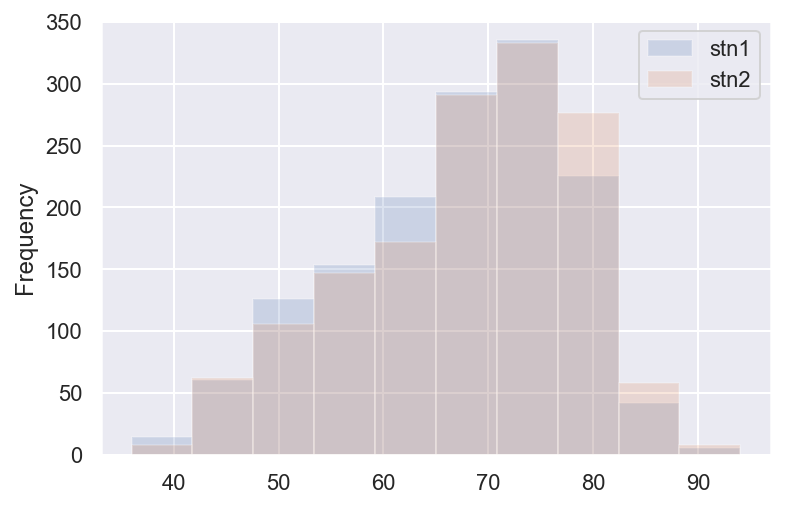

In [ ]:
tavg = pd.DataFrame(zip(weather_df[weather_df['station']==1]['tavg'], 
                        weather_df[weather_df['station']==2]['tavg']), 
                        columns=['stn1','stn2'])
tavg.dropna().plot(kind='hist', alpha=0.2)
tavg.dropna().describe()

Station1 and Station distribution are almost alike.
Station 2 have higher mean temperatures than station 1 by about ~1 degF.\
We will proceed to impute station 2 tavg based on this relationship.

In [ ]:
# for the index where tavg is null, adding +1 temperature using station1 data on same day
for i in missing_tavg_idx:
    weather_df.loc[i,'tavg'] = weather_df.loc[i-1,'tavg']+1 

In [ ]:
# create a list of indexes for station 1 and 2 for dates where there is missing tavg value for station 2
missing_tavg_idx1 = []
for i in missing_tavg_idx:
    missing_tavg_idx1.append(i-1)
    missing_tavg_idx1.append(i)
# check the filled tavg for station 2 is correctly filled, i.e. station 1 temp +1
weather_df.loc[missing_tavg_idx1,:]

,station,date,tmax,tmin,tavg,dewpoint,wetbulb,heat,cool,codesum,...,sealevel,resultspeed,resultdir,avgspeed,year,month,day,weekday,day_name,week
6,1,2007-05-04,66,49,58.0,41,50.0,7.0,0.0,RA,...,30.05,10.4,8,10.8,2007,5,4,4,Friday,18
7,2,2007-05-04,78,51,59.0,42,50.0,NaN,NaN,,...,30.04,10.1,7,10.4,2007,5,4,4,Friday,18
504,1,2008-07-08,85,70,78.0,67,71.0,0.0,13.0,,...,29.81,7.8,26,9.1,2008,7,8,1,Tuesday,28
505,2,2008-07-08,86,46,79.0,68,71.0,NaN,NaN,TS RA,...,29.80,7.4,24,8.3,2008,7,8,1,Tuesday,28
674,1,2008-10-01,61,46,54.0,40,47.0,11.0,0.0,,...,29.97,11.2,33,11.1,2008,10,1,2,Wednesday,40
675,2,2008-10-01,62,46,55.0,41,47.0,NaN,NaN,,...,29.96,10.9,33,11.0,2008,10,1,2,Wednesday,40
1636,1,2011-07-22,88,70,79.0,70,73.0,0.0,14.0,TS TSRA RA BR,...,29.88,1.7,9,9.0,2011,7,22,4,Friday,29
1637,2,2011-07-22,100,71,80.0,70,74.0,NaN,NaN,TS TSRA BR,...,29.86,3.8,10,8.2,2011,7,22,4,Friday,29
2066,1,2012-08-22,85,54,70.0,52,60.0,0.0,5.0,,...,30.07,5.5,19,5.8,2012,8,22,2,Wednesday,34
2067,2,2012-08-22,84,72,71.0,51,61.0,NaN,NaN,,...,NaN,4.7,19,NaN,2012,8,22,2,Wednesday,34


In [ ]:
weather_df['tavg'].isnull().sum() #to check null values in tavg that is 0

0

### Impute station pressure
Filter out the missing values in station pressure for imputation.\
We need the station pressure before we can impute wetbulb temperature.

In [ ]:
missing_stnp_idx = weather_df[weather_df['stnpressure'].isnull()].index #get the rows where stnpressure is null
weather_df[weather_df['stnpressure'].isnull()]

,station,date,tmax,tmin,tavg,dewpoint,wetbulb,heat,cool,codesum,...,sealevel,resultspeed,resultdir,avgspeed,year,month,day,weekday,day_name,week
87,2,2007-06-13,86,68,77.0,53,62.0,0.0,12.0,,...,NaN,7.0,5,NaN,2007,6,13,2,Wednesday,24
848,1,2009-06-26,86,69,78.0,60,NaN,0.0,13.0,,...,29.85,6.4,4,8.2,2009,6,26,4,Friday,26
2410,1,2013-08-10,81,64,73.0,57,NaN,0.0,8.0,,...,30.08,5.3,5,6.5,2013,8,10,5,Saturday,32
2411,2,2013-08-10,81,68,75.0,55,63.0,0.0,10.0,,...,30.07,6.0,6,7.4,2013,8,10,5,Saturday,32


There are 2 approaches to impute the station pressure.\
First, instead of comparing station 1 and station 2 pressure, lets take a look at the relationship of station pressure and sea level pressure.\
This is because there is a particular date where both station 1 and station 2 pressure are missing and we are not able to impute one pressure from the other for that particular date. \
Secondly, since there is a row with both missing station pressure and sea level pressure for station 2, we will attempt to infer the corresponding data from station 1 for the same date.

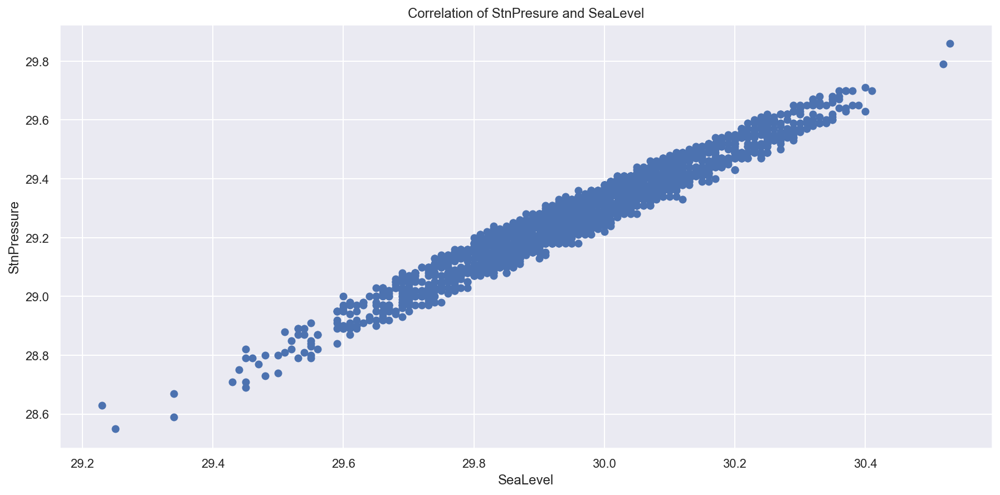

In [ ]:
plt.figure(figsize=(15,7))
plt.scatter(weather_df['sealevel'], weather_df['stnpressure'] )
plt.xlabel('SeaLevel')
plt.ylabel('StnPressure')
plt.title('Correlation of StnPresure and SeaLevel');

'SeaLevel' (x axis) and 'StnPressure' (y axis) are highly linearly correlated.

,stnpressure,sealevel
count,1465.000000,1465.000000
mean,29.254225,29.972812
std,0.156275,0.158253
min,28.550000,29.250000
25%,29.160000,29.880000
50%,29.260000,29.980000
75%,29.350000,30.070000
max,29.790000,30.520000


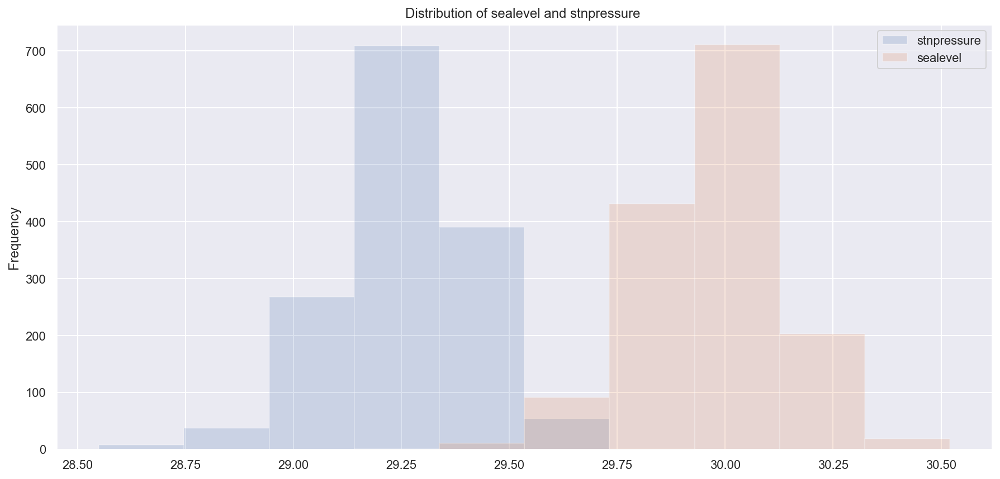

In [ ]:
stn1p = pd.DataFrame(zip(weather_df[weather_df['station']==1]['stnpressure'], 
                         weather_df[weather_df['station']==1]['sealevel']), 
                          columns=['stnpressure','sealevel'])
stn1p.dropna().plot(kind='hist', alpha=0.2,figsize=(15,7))
plt.title('Distribution of sealevel and stnpressure ')
stn1p.dropna().describe()
#getting the relationship of station pressure at station1 and sealevel

Station 1 pressure is ~0.72 lower than the sea level pressure based on the mean and median. \
Therefore we will impute the missing station 1 pressure using this relationship.\

As they are also highly correlated, we only need one of them (the other can be dropped) for modelling. Will drop 'SeaLevel' later.

In [ ]:
weather_df.loc[2411,'stnpressure']=weather_df.loc[2411,'sealevel']-0.72
weather_df.loc[2411,:] 

station                          2
date           2013-08-10 00:00:00
tmax                            81
tmin                            68
tavg                          75.0
dewpoint                        55
wetbulb                       63.0
heat                           0.0
cool                          10.0
codesum                           
preciptotal                   0.00
stnpressure                  29.35
sealevel                     30.07
resultspeed                    6.0
resultdir                        6
avgspeed                       7.4
year                          2013
month                            8
day                             10
weekday                          5
day_name                  Saturday
week                            32
Name: 2411, dtype: object

,stnpressure,sealevel
count,1468.000000,1468.000000
mean,29.314414,29.963460
std,0.155164,0.158907
min,28.630000,29.230000
25%,29.230000,29.870000
50%,29.320000,29.960000
75%,29.410000,30.060000
max,29.860000,30.530000


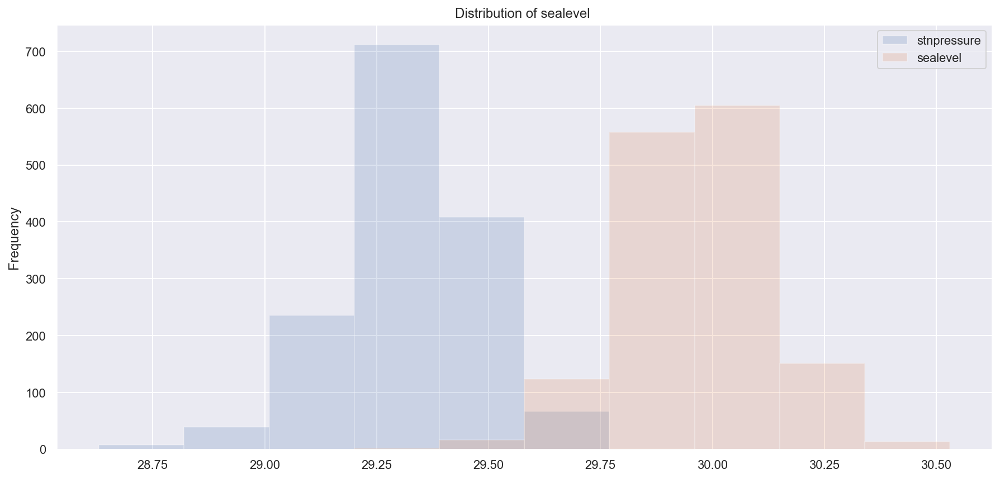

In [ ]:
stn2p = pd.DataFrame(zip(weather_df[weather_df['station']==2]['stnpressure'], weather_df[weather_df['station']==2]['sealevel']),
                     columns=['stnpressure','sealevel'])
stn2p.dropna().plot(kind='hist', alpha=0.2 ,  figsize=(15,7) )
plt.title('Distribution of sealevel ')
stn2p.dropna().describe()
#getting the station pressure at station2 and sealevel

Station 2 pressure is ~0.65 lower than the sea level pressure based on the mean and 75th percentile, while it is about ~0.64 lower based on the 25th and median.\
The difference is small and for simplicity, we will impute the missing station 2 pressure using the ~0.65 relationship.

In [ ]:
weather_df.loc[848,'stnpressure']=weather_df.loc[848,'sealevel']-0.65
weather_df.loc[2410,'stnpressure']=weather_df.loc[2410,'sealevel']-0.65
weather_df.loc[[848,2410],:]
#using station1 pressure and add -0.65 for missing values in station2 of station pressure

,station,date,tmax,tmin,tavg,dewpoint,wetbulb,heat,cool,codesum,...,sealevel,resultspeed,resultdir,avgspeed,year,month,day,weekday,day_name,week
848,1,2009-06-26,86,69,78.0,60,NaN,0.0,13.0,,...,29.85,6.4,4,8.2,2009,6,26,4,Friday,26
2410,1,2013-08-10,81,64,73.0,57,NaN,0.0,8.0,,...,30.08,5.3,5,6.5,2013,8,10,5,Saturday,32


Lets move on to check out the relationship of station pressure between station 1 and 2.

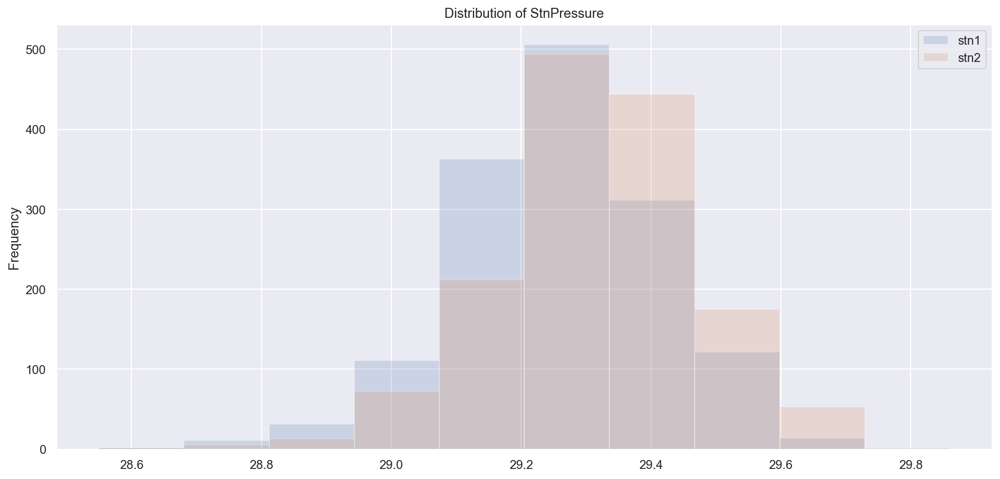

In [ ]:
stnp = pd.DataFrame(zip(weather_df[weather_df['station']==1]['stnpressure'], 
                        weather_df[weather_df['station']==2]['stnpressure']), 
                    columns=['stn1','stn2'])

stnp.dropna().plot(kind='hist', alpha=0.2, figsize=(15,7))
plt.title('Distribution of StnPressure')
stnp.dropna().describe();

Station1 and Station 2 distribution is similar.\
Station 2 pressure is ~0.06 higher than station 1 pressure based on the mean, median and 75th percentile.\
We will proceed to impute station 2 pressure accordingly based on station 1 pressure.

In [ ]:
weather_df.loc[[86, 87],:] 

,station,date,tmax,tmin,tavg,dewpoint,wetbulb,heat,cool,codesum,...,sealevel,resultspeed,resultdir,avgspeed,year,month,day,weekday,day_name,week
86,1,2007-06-13,87,60,74.0,53,62.0,0.0,9.0,,...,30.09,7.2,5,8.6,2007,6,13,2,Wednesday,24
87,2,2007-06-13,86,68,77.0,53,62.0,0.0,12.0,,...,NaN,7.0,5,NaN,2007,6,13,2,Wednesday,24


In [ ]:
weather_df.loc[87,'stnpressure'] = weather_df.loc[86, 'stnpressure']+0.06
weather_df.loc[[86, 87],:]
#using station2 pressure and add 0.06 for missing values in station2 of station pressure

,station,date,tmax,tmin,tavg,dewpoint,wetbulb,heat,cool,codesum,...,sealevel,resultspeed,resultdir,avgspeed,year,month,day,weekday,day_name,week
86,1,2007-06-13,87,60,74.0,53,62.0,0.0,9.0,,...,30.09,7.2,5,8.6,2007,6,13,2,Wednesday,24
87,2,2007-06-13,86,68,77.0,53,62.0,0.0,12.0,,...,NaN,7.0,5,NaN,2007,6,13,2,Wednesday,24


In [ ]:
weather_df['stnpressure'].isnull().sum()

0

### Impute wetbulb temperature
Wetbulb temperature can be imputed based on the average temperature, dewpoint and station pressure.

In [ ]:
missing_wb_idx = weather_df[weather_df['wetbulb'].isnull()].index
weather_df[weather_df['wetbulb'].isnull()]

,station,date,tmax,tmin,tavg,dewpoint,wetbulb,heat,cool,codesum,...,sealevel,resultspeed,resultdir,avgspeed,year,month,day,weekday,day_name,week
848,1,2009-06-26,86,69,78.0,60,NaN,0.0,13.0,,...,29.85,6.4,4,8.2,2009,6,26,4,Friday,26
2410,1,2013-08-10,81,64,73.0,57,NaN,0.0,8.0,,...,30.08,5.3,5,6.5,2013,8,10,5,Saturday,32
2412,1,2013-08-11,81,60,71.0,61,NaN,0.0,6.0,RA,...,30.07,2.0,27,3.0,2013,8,11,6,Sunday,32
2415,2,2013-08-12,85,69,77.0,63,NaN,0.0,12.0,RA,...,29.92,4.5,26,7.7,2013,8,12,0,Monday,33


Wetbulb temperature are computed from this [web link](https://www.weather.gov/epz/wxcalc_dewpoint), using tavg, dewpoint and stnpressure rounded to 0 decimal places.

| index | tavg | dewpoint | stnpressure | derived wetbulb |
|:-----:|:----:|:--------:|:-----------:|:---------------:|
|   848 |    78|   60     |     29.2    |       66        |
|  2410 |    73|   57     |     29.43   |       63        |
|  2412 |    71|   61     |     29.35   |       65        |
|  2415 |    77|   63     |     29.27   |       68        |


In [ ]:
#impute the change from the derived wetbulb
weather_df.loc[848,'wetbulb']=66
weather_df.loc[2410,'wetbulb']=63
weather_df.loc[2412,'wetbulb']=65
weather_df.loc[2415,'wetbulb']=68
weather_df.loc[missing_wb_idx,:]

,station,date,tmax,tmin,tavg,dewpoint,wetbulb,heat,cool,codesum,...,sealevel,resultspeed,resultdir,avgspeed,year,month,day,weekday,day_name,week
848,1,2009-06-26,86,69,78.0,60,66.0,0.0,13.0,,...,29.85,6.4,4,8.2,2009,6,26,4,Friday,26
2410,1,2013-08-10,81,64,73.0,57,63.0,0.0,8.0,,...,30.08,5.3,5,6.5,2013,8,10,5,Saturday,32
2412,1,2013-08-11,81,60,71.0,61,65.0,0.0,6.0,RA,...,30.07,2.0,27,3.0,2013,8,11,6,Sunday,32
2415,2,2013-08-12,85,69,77.0,63,68.0,0.0,12.0,RA,...,29.92,4.5,26,7.7,2013,8,12,0,Monday,33


In [ ]:
weather_df['wetbulb'].isnull().sum()

0

### Impute Heat and Cool
The heat and cool is based off a threshold temperature of 65degF.\
i.e. heat = (65 - tavg) if tavg < 65, else 0\
i.e. cool = (tavg - 65) if tavg > 65, else 0

In [ ]:
missing_heat_idx = weather_df[weather_df['heat'].isnull()].index
#get the index where there are null values in heat
weather_df[weather_df['heat'].isnull()] #view those columns that are null in heat

,station,date,tmax,tmin,tavg,dewpoint,wetbulb,heat,cool,codesum,...,sealevel,resultspeed,resultdir,avgspeed,year,month,day,weekday,day_name,week
7,2,2007-05-04,78,51,59.0,42,50.0,NaN,NaN,,...,30.04,10.1,7,10.4,2007,5,4,4,Friday,18
505,2,2008-07-08,86,46,79.0,68,71.0,NaN,NaN,TS RA,...,29.80,7.4,24,8.3,2008,7,8,1,Tuesday,28
675,2,2008-10-01,62,46,55.0,41,47.0,NaN,NaN,,...,29.96,10.9,33,11.0,2008,10,1,2,Wednesday,40
1637,2,2011-07-22,100,71,80.0,70,74.0,NaN,NaN,TS TSRA BR,...,29.86,3.8,10,8.2,2011,7,22,4,Friday,29
2067,2,2012-08-22,84,72,71.0,51,61.0,NaN,NaN,,...,NaN,4.7,19,NaN,2012,8,22,2,Wednesday,34
2211,2,2013-05-02,71,42,50.0,39,45.0,NaN,NaN,,...,30.17,15.8,2,16.1,2013,5,2,3,Thursday,18
2501,2,2013-09-24,91,52,61.0,48,54.0,NaN,NaN,,...,30.00,5.8,9,7.7,2013,9,24,1,Tuesday,39
2511,2,2013-09-29,84,53,61.0,48,54.0,NaN,NaN,RA BR,...,30.01,6.3,36,7.8,2013,9,29,6,Sunday,39
2525,2,2013-10-06,76,48,56.0,44,50.0,NaN,NaN,RA DZ BR,...,29.76,10.1,25,10.6,2013,10,6,6,Sunday,40
2579,2,2014-05-02,80,47,51.0,43,47.0,NaN,NaN,RA,...,29.79,10.7,23,11.9,2014,5,2,4,Friday,18


In [ ]:
weather_df.loc[missing_heat_idx,'heat'] = weather_df.loc[missing_heat_idx,'tavg'].map(
    lambda x : (65 - x) if x <= 65 else 0)
weather_df.loc[missing_heat_idx]
#map to heat columns (65 - tavg) if tavg < 65, else 0

,station,date,tmax,tmin,tavg,dewpoint,wetbulb,heat,cool,codesum,...,sealevel,resultspeed,resultdir,avgspeed,year,month,day,weekday,day_name,week
7,2,2007-05-04,78,51,59.0,42,50.0,6.0,NaN,,...,30.04,10.1,7,10.4,2007,5,4,4,Friday,18
505,2,2008-07-08,86,46,79.0,68,71.0,0.0,NaN,TS RA,...,29.80,7.4,24,8.3,2008,7,8,1,Tuesday,28
675,2,2008-10-01,62,46,55.0,41,47.0,10.0,NaN,,...,29.96,10.9,33,11.0,2008,10,1,2,Wednesday,40
1637,2,2011-07-22,100,71,80.0,70,74.0,0.0,NaN,TS TSRA BR,...,29.86,3.8,10,8.2,2011,7,22,4,Friday,29
2067,2,2012-08-22,84,72,71.0,51,61.0,0.0,NaN,,...,NaN,4.7,19,NaN,2012,8,22,2,Wednesday,34
2211,2,2013-05-02,71,42,50.0,39,45.0,15.0,NaN,,...,30.17,15.8,2,16.1,2013,5,2,3,Thursday,18
2501,2,2013-09-24,91,52,61.0,48,54.0,4.0,NaN,,...,30.00,5.8,9,7.7,2013,9,24,1,Tuesday,39
2511,2,2013-09-29,84,53,61.0,48,54.0,4.0,NaN,RA BR,...,30.01,6.3,36,7.8,2013,9,29,6,Sunday,39
2525,2,2013-10-06,76,48,56.0,44,50.0,9.0,NaN,RA DZ BR,...,29.76,10.1,25,10.6,2013,10,6,6,Sunday,40
2579,2,2014-05-02,80,47,51.0,43,47.0,14.0,NaN,RA,...,29.79,10.7,23,11.9,2014,5,2,4,Friday,18


In [ ]:
missing_cool_idx = weather_df[weather_df['cool'].isnull()].index 
#get the index where there are null values in cool
weather_df[weather_df['cool'].isnull()]  #view those columns that are null in cool

,station,date,tmax,tmin,tavg,dewpoint,wetbulb,heat,cool,codesum,...,sealevel,resultspeed,resultdir,avgspeed,year,month,day,weekday,day_name,week
7,2,2007-05-04,78,51,59.0,42,50.0,6.0,NaN,,...,30.04,10.1,7,10.4,2007,5,4,4,Friday,18
505,2,2008-07-08,86,46,79.0,68,71.0,0.0,NaN,TS RA,...,29.80,7.4,24,8.3,2008,7,8,1,Tuesday,28
675,2,2008-10-01,62,46,55.0,41,47.0,10.0,NaN,,...,29.96,10.9,33,11.0,2008,10,1,2,Wednesday,40
1637,2,2011-07-22,100,71,80.0,70,74.0,0.0,NaN,TS TSRA BR,...,29.86,3.8,10,8.2,2011,7,22,4,Friday,29
2067,2,2012-08-22,84,72,71.0,51,61.0,0.0,NaN,,...,NaN,4.7,19,NaN,2012,8,22,2,Wednesday,34
2211,2,2013-05-02,71,42,50.0,39,45.0,15.0,NaN,,...,30.17,15.8,2,16.1,2013,5,2,3,Thursday,18
2501,2,2013-09-24,91,52,61.0,48,54.0,4.0,NaN,,...,30.00,5.8,9,7.7,2013,9,24,1,Tuesday,39
2511,2,2013-09-29,84,53,61.0,48,54.0,4.0,NaN,RA BR,...,30.01,6.3,36,7.8,2013,9,29,6,Sunday,39
2525,2,2013-10-06,76,48,56.0,44,50.0,9.0,NaN,RA DZ BR,...,29.76,10.1,25,10.6,2013,10,6,6,Sunday,40
2579,2,2014-05-02,80,47,51.0,43,47.0,14.0,NaN,RA,...,29.79,10.7,23,11.9,2014,5,2,4,Friday,18


In [ ]:
weather_df.loc[missing_cool_idx,'cool'] = weather_df.loc[missing_cool_idx,'tavg'].map(
    lambda x : (x - 65) if x >= 65 else 0)
weather_df.loc[missing_cool_idx]

# map to cool column where there is null values such that (tavg - 65) if tavg > 65, else 0

,station,date,tmax,tmin,tavg,dewpoint,wetbulb,heat,cool,codesum,...,sealevel,resultspeed,resultdir,avgspeed,year,month,day,weekday,day_name,week
7,2,2007-05-04,78,51,59.0,42,50.0,6.0,0.0,,...,30.04,10.1,7,10.4,2007,5,4,4,Friday,18
505,2,2008-07-08,86,46,79.0,68,71.0,0.0,14.0,TS RA,...,29.80,7.4,24,8.3,2008,7,8,1,Tuesday,28
675,2,2008-10-01,62,46,55.0,41,47.0,10.0,0.0,,...,29.96,10.9,33,11.0,2008,10,1,2,Wednesday,40
1637,2,2011-07-22,100,71,80.0,70,74.0,0.0,15.0,TS TSRA BR,...,29.86,3.8,10,8.2,2011,7,22,4,Friday,29
2067,2,2012-08-22,84,72,71.0,51,61.0,0.0,6.0,,...,NaN,4.7,19,NaN,2012,8,22,2,Wednesday,34
2211,2,2013-05-02,71,42,50.0,39,45.0,15.0,0.0,,...,30.17,15.8,2,16.1,2013,5,2,3,Thursday,18
2501,2,2013-09-24,91,52,61.0,48,54.0,4.0,0.0,,...,30.00,5.8,9,7.7,2013,9,24,1,Tuesday,39
2511,2,2013-09-29,84,53,61.0,48,54.0,4.0,0.0,RA BR,...,30.01,6.3,36,7.8,2013,9,29,6,Sunday,39
2525,2,2013-10-06,76,48,56.0,44,50.0,9.0,0.0,RA DZ BR,...,29.76,10.1,25,10.6,2013,10,6,6,Sunday,40
2579,2,2014-05-02,80,47,51.0,43,47.0,14.0,0.0,RA,...,29.79,10.7,23,11.9,2014,5,2,4,Friday,18


In [ ]:
weather_df['heat'].isnull().sum()

0

In [ ]:
weather_df['cool'].isnull().sum()

0

### Impute Average Speed


In [ ]:
missing_avespeed_idx = weather_df[weather_df['avgspeed'].isnull()].index
weather_df[weather_df['avgspeed'].isnull()]

,station,date,tmax,tmin,tavg,dewpoint,wetbulb,heat,cool,codesum,...,sealevel,resultspeed,resultdir,avgspeed,year,month,day,weekday,day_name,week
87,2,2007-06-13,86,68,77.0,53,62.0,0.0,12.0,,...,NaN,7.0,5,NaN,2007,6,13,2,Wednesday,24
1745,2,2011-09-14,60,48,54.0,45,51.0,11.0,0.0,RA BR HZ FU,...,NaN,6.0,32,NaN,2011,9,14,2,Wednesday,37
2067,2,2012-08-22,84,72,71.0,51,61.0,0.0,6.0,,...,NaN,4.7,19,NaN,2012,8,22,2,Wednesday,34


In [ ]:
missing_tavg_idx

Int64Index([7, 505, 675, 1637, 2067, 2211, 2501, 2511, 2525, 2579, 2811], dtype='int64')

Take a look at the relationship of average speed between station 1 and station 2.

,stn1,stn2
count,1469.000000,1469.000000
mean,8.573519,8.590129
std,3.189511,3.107809
min,1.900000,1.700000
25%,6.200000,6.300000
50%,8.100000,8.100000
75%,10.400000,10.400000
max,26.300000,22.600000


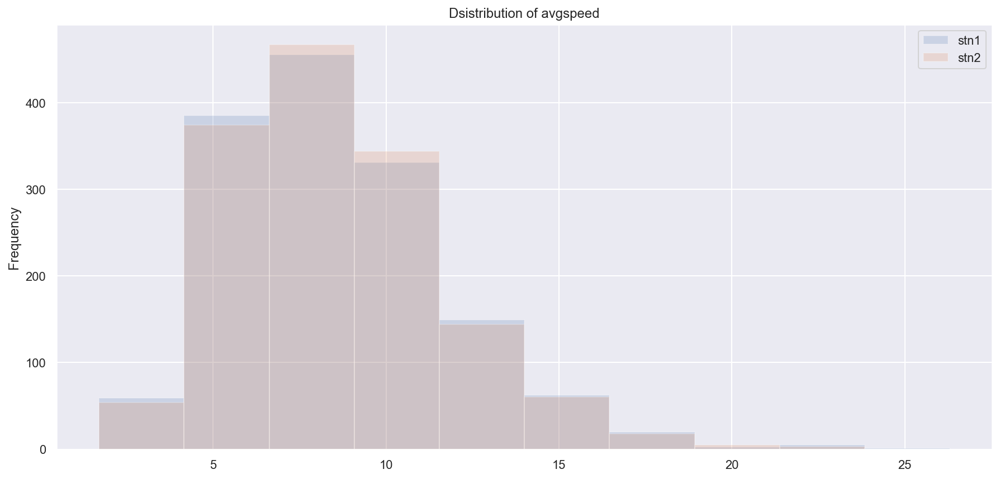

In [ ]:
avgsp = pd.DataFrame(zip(weather_df[weather_df['station']==1]['avgspeed'], weather_df[weather_df['station']==2]['avgspeed']), 
                     columns=['stn1','stn2'])
avgsp.dropna().plot(kind='hist', alpha=0.2, figsize=(15,7))
plt.title('Dsistribution of avgspeed')
avgsp.dropna().describe()

Take a look at the relationship between average speed and resultant speed at station 2.

,avgspeed,resultspeed
count,1469.000000,1469.000000
mean,8.590129,6.936351
std,3.107809,3.592834
min,1.700000,0.300000
25%,6.300000,4.200000
50%,8.100000,6.500000
75%,10.400000,9.300000
max,22.600000,21.700000


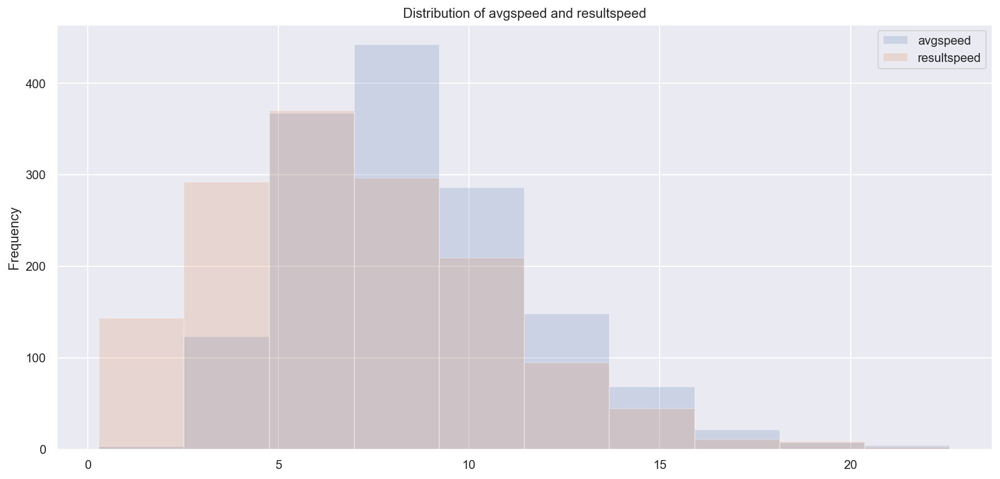

In [ ]:
windsp2 = pd.DataFrame(zip(weather_df[weather_df['station']==2]['avgspeed'],
                           weather_df[weather_df['station']==2]['resultspeed']), columns=['avgspeed','resultspeed'])
windsp2.dropna().plot(kind='hist', alpha=0.2, figsize=(15,7))
plt.title('Distribution of avgspeed and resultspeed')
windsp2.dropna().describe()

At a glance, it seems to make more sense imputing the missing station 2 average speed using station 1 average speed.\
Given that there are only 3 missing values, will keep it simple and impute based on station 1 average speed, i.e. we will assume the missing station 2 average speed is same as station 1.

In [ ]:
weather_df['avgspeed'].fillna(method='ffill', inplace=True)
missing_avespeed_idx1 = []
for i in missing_avespeed_idx:
    missing_avespeed_idx1.append(i-1)
    missing_avespeed_idx1.append(i)
weather_df.loc[missing_avespeed_idx1,:]

,station,date,tmax,tmin,tavg,dewpoint,wetbulb,heat,cool,codesum,...,sealevel,resultspeed,resultdir,avgspeed,year,month,day,weekday,day_name,week
86,1,2007-06-13,87,60,74.0,53,62.0,0.0,9.0,,...,30.09,7.2,5,8.6,2007,6,13,2,Wednesday,24
87,2,2007-06-13,86,68,77.0,53,62.0,0.0,12.0,,...,NaN,7.0,5,8.6,2007,6,13,2,Wednesday,24
1744,1,2011-09-14,58,47,53.0,43,49.0,12.0,0.0,RA BR HZ FU,...,30.09,6.3,34,7.3,2011,9,14,2,Wednesday,37
1745,2,2011-09-14,60,48,54.0,45,51.0,11.0,0.0,RA BR HZ FU,...,NaN,6.0,32,7.3,2011,9,14,2,Wednesday,37
2066,1,2012-08-22,85,54,70.0,52,60.0,0.0,5.0,,...,30.07,5.5,19,5.8,2012,8,22,2,Wednesday,34
2067,2,2012-08-22,84,72,71.0,51,61.0,0.0,6.0,,...,NaN,4.7,19,5.8,2012,8,22,2,Wednesday,34


In [ ]:
weather_df['avgspeed'].isnull().sum()

0

### Impute precipitation

Check if there are any non numeric in preciptotal.

In [ ]:
weather_df['preciptotal'].value_counts()

0.00    1577
  T      318
0.01     127
0.02      63
0.03      46
        ... 
2.20       1
1.14       1
1.07       1
1.06       1
2.24       1
Name: preciptotal, Length: 168, dtype: int64

In [ ]:
weather_df[weather_df['preciptotal'] == '  T']

,station,date,tmax,tmin,tavg,dewpoint,wetbulb,heat,cool,codesum,...,sealevel,resultspeed,resultdir,avgspeed,year,month,day,weekday,day_name,week
6,1,2007-05-04,66,49,58.0,41,50.0,7.0,0.0,RA,...,30.05,10.4,8,10.8,2007,5,4,4,Friday,18
8,1,2007-05-05,66,53,60.0,38,49.0,5.0,0.0,,...,30.10,11.7,7,12.0,2007,5,5,5,Saturday,18
9,2,2007-05-05,66,54,60.0,39,50.0,5.0,0.0,,...,30.09,11.2,7,11.5,2007,5,5,5,Saturday,18
12,1,2007-05-07,83,47,65.0,41,54.0,0.0,0.0,RA,...,30.12,8.6,18,10.5,2007,5,7,0,Monday,19
15,2,2007-05-08,80,60,70.0,57,63.0,0.0,5.0,HZ,...,30.02,2.5,8,5.4,2007,5,8,1,Tuesday,19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2913,2,2014-10-16,58,53,56.0,52,53.0,9.0,0.0,DZ BR,...,29.77,5.4,25,8.4,2014,10,16,3,Thursday,42
2914,1,2014-10-17,62,48,55.0,46,50.0,10.0,0.0,,...,29.69,11.1,29,13.2,2014,10,17,4,Friday,42
2927,2,2014-10-23,62,41,52.0,41,47.0,13.0,0.0,BR,...,30.16,7.9,19,8.4,2014,10,23,3,Thursday,43
2936,1,2014-10-28,68,45,57.0,38,47.0,8.0,0.0,,...,29.85,14.8,26,15.6,2014,10,28,1,Tuesday,44


Assuming that T (trace) represents a very small amount of rainfall, and that the existing smallest rainfall quantity defined is 0.01, we will impute T with a number smaller than 0.01, i.e. 0.005.

In [ ]:
weather_df['preciptotal'] = [ 0.005 if i == '  T' else i for i in weather_df['preciptotal']]

In [ ]:
weather_df['preciptotal'].unique()

array(['0.00', 0.005, '0.13', '0.02', '0.38', '0.60', '0.14', '0.07',
       '0.11', '0.09', '1.01', '0.28', '0.04', '0.08', '0.01', '0.53',
       '0.19', '0.21', '0.32', '0.39', '0.31', '0.42', '0.27', '0.16',
       '0.58', '0.93', '0.05', '0.34', '0.15', '0.35', 'M', '0.40',
       '0.66', '0.30', '0.24', '0.43', '1.55', '0.92', '0.89', '0.17',
       '0.03', '1.43', '0.97', '0.26', '1.31', '0.06', '0.46', '0.29',
       '0.23', '0.41', '0.45', '0.83', '1.33', '0.91', '0.48', '0.37',
       '0.88', '2.35', '1.96', '0.20', '0.25', '0.18', '0.67', '0.36',
       '0.33', '1.28', '0.74', '0.76', '0.71', '0.95', '1.46', '0.12',
       '0.52', '0.64', '0.22', '1.24', '0.72', '0.73', '0.65', '1.61',
       '1.22', '0.50', '1.05', '2.43', '0.59', '2.90', '2.68', '1.23',
       '0.62', '6.64', '3.07', '1.44', '1.75', '0.82', '0.80', '0.86',
       '0.63', '0.55', '1.03', '0.70', '1.73', '1.38', '0.44', '1.14',
       '1.07', '3.97', '0.87', '0.78', '1.12', '0.68', '0.10', '0.61',
       '0.

In [ ]:
weather_df[weather_df['preciptotal']=='M']

,station,date,tmax,tmin,tavg,dewpoint,wetbulb,heat,cool,codesum,...,sealevel,resultspeed,resultdir,avgspeed,year,month,day,weekday,day_name,week
117,2,2007-06-28,73,61,67.0,56,61.0,0.0,2.0,,...,30.07,12.2,2,13.3,2007,6,28,3,Thursday,26
119,2,2007-06-29,71,56,64.0,56,60.0,1.0,0.0,,...,30.11,7.4,2,8.2,2007,6,29,4,Friday,26


Seems like there are entries with 'M'. Lets take a look at these.

Check the codesum for these 'M' entries.

In [ ]:
weather_df[weather_df['preciptotal']=='M'][['codesum','preciptotal']]

,codesum,preciptotal
117,,M
119,,M


Take a look at the bulk of data where codesum is a whitespace.

In [ ]:
weather_df[weather_df['codesum']==' ']['preciptotal'].value_counts()

0.00     1383
0.005     136
0.01       38
0.02        9
0.03        7
0.05        4
0.17        3
0.04        3
0.15        2
0.20        2
0.12        2
0.07        2
0.11        2
M           2
0.06        2
0.43        1
0.54        1
0.18        1
0.44        1
0.37        1
0.55        1
0.27        1
0.16        1
0.09        1
0.08        1
0.50        1
0.29        1
Name: preciptotal, dtype: int64

Seems like majority of the data when codesum is a whitespace has no rainfall. Will impute these missing data in the preciptotal as 0 since its corresponding codesum is a whitespace.

In [ ]:
weather_df['preciptotal'] = [ 0 if i == 'M' else i for i in weather_df['preciptotal']]

In [ ]:
weather_df['preciptotal'].unique()

array(['0.00', 0.005, '0.13', '0.02', '0.38', '0.60', '0.14', '0.07',
       '0.11', '0.09', '1.01', '0.28', '0.04', '0.08', '0.01', '0.53',
       '0.19', '0.21', '0.32', '0.39', '0.31', '0.42', '0.27', '0.16',
       '0.58', '0.93', '0.05', '0.34', '0.15', '0.35', 0, '0.40', '0.66',
       '0.30', '0.24', '0.43', '1.55', '0.92', '0.89', '0.17', '0.03',
       '1.43', '0.97', '0.26', '1.31', '0.06', '0.46', '0.29', '0.23',
       '0.41', '0.45', '0.83', '1.33', '0.91', '0.48', '0.37', '0.88',
       '2.35', '1.96', '0.20', '0.25', '0.18', '0.67', '0.36', '0.33',
       '1.28', '0.74', '0.76', '0.71', '0.95', '1.46', '0.12', '0.52',
       '0.64', '0.22', '1.24', '0.72', '0.73', '0.65', '1.61', '1.22',
       '0.50', '1.05', '2.43', '0.59', '2.90', '2.68', '1.23', '0.62',
       '6.64', '3.07', '1.44', '1.75', '0.82', '0.80', '0.86', '0.63',
       '0.55', '1.03', '0.70', '1.73', '1.38', '0.44', '1.14', '1.07',
       '3.97', '0.87', '0.78', '1.12', '0.68', '0.10', '0.61', '0.54',
    

Update the preciptotal column to float from object.

In [ ]:
weather_df['preciptotal'] = pd.to_numeric(weather_df['preciptotal'])  #convert to float

In [ ]:
weather_df['preciptotal'].isnull().sum()

0

### Final check for null values

In [ ]:
#dropping sealevel 
weather_df.drop(columns='sealevel', inplace=True)
weather_df.head()

,station,date,tmax,tmin,tavg,dewpoint,wetbulb,heat,cool,codesum,...,stnpressure,resultspeed,resultdir,avgspeed,year,month,day,weekday,day_name,week
0,1,2007-05-01,83,50,67.0,51,56.0,0.0,2.0,,...,29.10,1.7,27,9.2,2007,5,1,1,Tuesday,18
1,2,2007-05-01,84,52,68.0,51,57.0,0.0,3.0,,...,29.18,2.7,25,9.6,2007,5,1,1,Tuesday,18
2,1,2007-05-02,59,42,51.0,42,47.0,14.0,0.0,BR,...,29.38,13.0,4,13.4,2007,5,2,2,Wednesday,18
3,2,2007-05-02,60,43,52.0,42,47.0,13.0,0.0,BR HZ,...,29.44,13.3,2,13.4,2007,5,2,2,Wednesday,18
4,1,2007-05-03,66,46,56.0,40,48.0,9.0,0.0,,...,29.39,11.7,7,11.9,2007,5,3,3,Thursday,18


In [ ]:
weather_df.isnull().sum()

station        0
date           0
tmax           0
tmin           0
tavg           0
dewpoint       0
wetbulb        0
heat           0
cool           0
codesum        0
preciptotal    0
stnpressure    0
resultspeed    0
resultdir      0
avgspeed       0
year           0
month          0
day            0
weekday        0
day_name       0
week           0
dtype: int64

In [ ]:
weather_df.head()

,station,date,tmax,tmin,tavg,dewpoint,wetbulb,heat,cool,codesum,...,stnpressure,resultspeed,resultdir,avgspeed,year,month,day,weekday,day_name,week
0,1,2007-05-01,83,50,67.0,51,56.0,0.0,2.0,,...,29.10,1.7,27,9.2,2007,5,1,1,Tuesday,18
1,2,2007-05-01,84,52,68.0,51,57.0,0.0,3.0,,...,29.18,2.7,25,9.6,2007,5,1,1,Tuesday,18
2,1,2007-05-02,59,42,51.0,42,47.0,14.0,0.0,BR,...,29.38,13.0,4,13.4,2007,5,2,2,Wednesday,18
3,2,2007-05-02,60,43,52.0,42,47.0,13.0,0.0,BR HZ,...,29.44,13.3,2,13.4,2007,5,2,2,Wednesday,18
4,1,2007-05-03,66,46,56.0,40,48.0,9.0,0.0,,...,29.39,11.7,7,11.9,2007,5,3,3,Thursday,18


###  Dealing with CodeSum

As there are multiple values in codesum, we will split them and create new columns with the counts of each value found.

In [ ]:
code_sum = []

def get_code_sum_elems(code_sum_string): 
    global code_sum # use the global variable
    code_sum.extend(code_sum_string.split())
    return True

for i in weather_df['codesum']:
    get_code_sum_elems(i.strip())

code_sum_set = set(code_sum)
print(code_sum_set)

{'HZ', 'BR', 'VCTS', 'FU', 'BCFG', 'SQ', 'FG', 'SN', 'TSRA', 'RA', 'FG+', 'DZ', 'TS', 'MIFG', 'VCFG', 'GR'}


In [ ]:
# for each codesum element, create a column (total of 16 columns)
for i in code_sum_set:
    weather_df[i] = 0

In [ ]:
for index, row in weather_df.iterrows():
    cs_list = row['codesum'].split() # split the codesum string
    for j in cs_list:
        #set corresponding column to 1
        if j in code_sum_set: 
            weather_df.loc[index,j]=1

In [ ]:
weather_df.shape

(2944, 37)

In [ ]:
weather_df.head(5)

,station,date,tmax,tmin,tavg,dewpoint,wetbulb,heat,cool,codesum,...,FG,SN,TSRA,RA,FG+,DZ,TS,MIFG,VCFG,GR
0,1,2007-05-01,83,50,67.0,51,56.0,0.0,2.0,,...,0,0,0,0,0,0,0,0,0,0
1,2,2007-05-01,84,52,68.0,51,57.0,0.0,3.0,,...,0,0,0,0,0,0,0,0,0,0
2,1,2007-05-02,59,42,51.0,42,47.0,14.0,0.0,BR,...,0,0,0,0,0,0,0,0,0,0
3,2,2007-05-02,60,43,52.0,42,47.0,13.0,0.0,BR HZ,...,0,0,0,0,0,0,0,0,0,0
4,1,2007-05-03,66,46,56.0,40,48.0,9.0,0.0,,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
weather_df.drop(labels='codesum',axis=1,inplace=True) # drop the codesum

###  Calculate and add Relative Humidity

Based on research via [link](https://www.mdpi.com/1660-4601/17/4/1403/pdf), temperature and relative humidity have been shown
to affect mosquito activity positively. Since there is no humidity data, we can calculate with the datas given

In [ ]:
# calculate the average temperature in celsius
weather_df['tavg_c'] = 5/9 * (weather_df['tavg'] - 32)

In [ ]:
# calculate the dewpoint temperature in celsius
weather_df['dewpoint_c'] = 5/9 * (weather_df['dewpoint'] - 32)

In [ ]:
# calculate the saturated vapour pressure in mbar
weather_df['sat_vap'] = 6.11*10**((7.5*weather_df['tavg_c'])/(237.3+weather_df['tavg_c']))

In [ ]:
# calculate the actual vapour pressure in mbar
weather_df['act_vap'] = 6.11*10**((7.5*weather_df['dewpoint_c'])/(237.3+weather_df['dewpoint_c']))

In [ ]:
# calculate the relative humidity
weather_df['rel_humidity'] = weather_df['act_vap']/weather_df['sat_vap']*100

In [ ]:
weather_df.head()

,station,date,tmax,tmin,tavg,dewpoint,wetbulb,heat,cool,preciptotal,...,DZ,TS,MIFG,VCFG,GR,tavg_c,dewpoint_c,sat_vap,act_vap,rel_humidity
0,1,2007-05-01,83,50,67.0,51,56.0,0.0,2.0,0.0,...,0,0,0,0,0,19.444444,10.555556,22.597006,12.748165,56.415283
1,2,2007-05-01,84,52,68.0,51,57.0,0.0,3.0,0.0,...,0,0,0,0,0,20.000000,10.555556,23.389357,12.748165,54.504128
2,1,2007-05-02,59,42,51.0,42,47.0,14.0,0.0,0.0,...,0,0,0,0,0,10.555556,5.555556,12.748165,9.070077,71.148096
3,2,2007-05-02,60,43,52.0,42,47.0,13.0,0.0,0.0,...,0,0,0,0,0,11.111111,5.555556,13.228378,9.070077,68.565295
4,1,2007-05-03,66,46,56.0,40,48.0,9.0,0.0,0.0,...,0,0,0,0,0,13.333333,4.444444,15.311948,8.393206,54.814749


### Drop unneeded columns from relative humidity calculation.

In [ ]:
weather_df.drop(columns = ['tavg_c', 'dewpoint_c', 'sat_vap', 'act_vap'], inplace=True,axis=1)

In [ ]:
weather_df.head()

,station,date,tmax,tmin,tavg,dewpoint,wetbulb,heat,cool,preciptotal,...,SN,TSRA,RA,FG+,DZ,TS,MIFG,VCFG,GR,rel_humidity
0,1,2007-05-01,83,50,67.0,51,56.0,0.0,2.0,0.0,...,0,0,0,0,0,0,0,0,0,56.415283
1,2,2007-05-01,84,52,68.0,51,57.0,0.0,3.0,0.0,...,0,0,0,0,0,0,0,0,0,54.504128
2,1,2007-05-02,59,42,51.0,42,47.0,14.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,71.148096
3,2,2007-05-02,60,43,52.0,42,47.0,13.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,68.565295
4,1,2007-05-03,66,46,56.0,40,48.0,9.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,54.814749


### Rearrange the relative humidity column

In [ ]:
# define function to shift columns
def movecol(df, cols_to_move=[], ref_col='', place='After'):
    
    cols = df.columns.tolist()
    if place == 'After':
        seg1 = cols[:list(cols).index(ref_col) + 1]
        seg2 = cols_to_move
    if place == 'Before':
        seg1 = cols[:list(cols).index(ref_col)]
        seg2 = cols_to_move + [ref_col]
    
    seg1 = [i for i in seg1 if i not in seg2]
    seg3 = [i for i in cols if i not in seg1 + seg2]
    
    return(df[seg1 + seg2 + seg3])

In [ ]:
weather_df = movecol(weather_df, cols_to_move=['rel_humidity'], ref_col='avgspeed', place='After')

In [ ]:
weather_df.head()

,station,date,tmax,tmin,tavg,dewpoint,wetbulb,heat,cool,preciptotal,...,FG,SN,TSRA,RA,FG+,DZ,TS,MIFG,VCFG,GR
0,1,2007-05-01,83,50,67.0,51,56.0,0.0,2.0,0.0,...,0,0,0,0,0,0,0,0,0,0
1,2,2007-05-01,84,52,68.0,51,57.0,0.0,3.0,0.0,...,0,0,0,0,0,0,0,0,0,0
2,1,2007-05-02,59,42,51.0,42,47.0,14.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
3,2,2007-05-02,60,43,52.0,42,47.0,13.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0
4,1,2007-05-03,66,46,56.0,40,48.0,9.0,0.0,0.0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
weather_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2944 entries, 0 to 2943
Data columns (total 37 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   station       2944 non-null   int64         
 1   date          2944 non-null   datetime64[ns]
 2   tmax          2944 non-null   int64         
 3   tmin          2944 non-null   int64         
 4   tavg          2944 non-null   float64       
 5   dewpoint      2944 non-null   int64         
 6   wetbulb       2944 non-null   float64       
 7   heat          2944 non-null   float64       
 8   cool          2944 non-null   float64       
 9   preciptotal   2944 non-null   float64       
 10  stnpressure   2944 non-null   float64       
 11  resultspeed   2944 non-null   float64       
 12  resultdir     2944 non-null   int64         
 13  avgspeed      2944 non-null   float64       
 14  rel_humidity  2944 non-null   float64       
 15  year          2944 non-null   int64   

### Incorporate the longitude and latitude data 
We need to include the location for the weather stations as these will be used to map the locations of mosquitos traps in the other data set.\
Station 1: CHICAGO O'HARE INTERNATIONAL AIRPORT Lat: 41.995 Lon: -87.933 Elev: 662 ft. above sea level\
Station 2: CHICAGO MIDWAY INTL ARPT Lat: 41.786 Lon: -87.752 Elev: 612 ft. above sea level

In [ ]:
weather_df['latitude'] = [41.995 if i == 1 else 41.786 for i in weather_df['station']] 
weather_df['longitude'] = [-87.933 if i ==1 else -87.752 for i in weather_df['station']]

In [ ]:
weather_df.head()

,station,date,tmax,tmin,tavg,dewpoint,wetbulb,heat,cool,preciptotal,...,TSRA,RA,FG+,DZ,TS,MIFG,VCFG,GR,latitude,longitude
0,1,2007-05-01,83,50,67.0,51,56.0,0.0,2.0,0.0,...,0,0,0,0,0,0,0,0,41.995,-87.933
1,2,2007-05-01,84,52,68.0,51,57.0,0.0,3.0,0.0,...,0,0,0,0,0,0,0,0,41.786,-87.752
2,1,2007-05-02,59,42,51.0,42,47.0,14.0,0.0,0.0,...,0,0,0,0,0,0,0,0,41.995,-87.933
3,2,2007-05-02,60,43,52.0,42,47.0,13.0,0.0,0.0,...,0,0,0,0,0,0,0,0,41.786,-87.752
4,1,2007-05-03,66,46,56.0,40,48.0,9.0,0.0,0.0,...,0,0,0,0,0,0,0,0,41.995,-87.933


In [ ]:
weather_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2944 entries, 0 to 2943
Data columns (total 39 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   station       2944 non-null   int64         
 1   date          2944 non-null   datetime64[ns]
 2   tmax          2944 non-null   int64         
 3   tmin          2944 non-null   int64         
 4   tavg          2944 non-null   float64       
 5   dewpoint      2944 non-null   int64         
 6   wetbulb       2944 non-null   float64       
 7   heat          2944 non-null   float64       
 8   cool          2944 non-null   float64       
 9   preciptotal   2944 non-null   float64       
 10  stnpressure   2944 non-null   float64       
 11  resultspeed   2944 non-null   float64       
 12  resultdir     2944 non-null   int64         
 13  avgspeed      2944 non-null   float64       
 14  rel_humidity  2944 non-null   float64       
 15  year          2944 non-null   int64   

# Train EDA

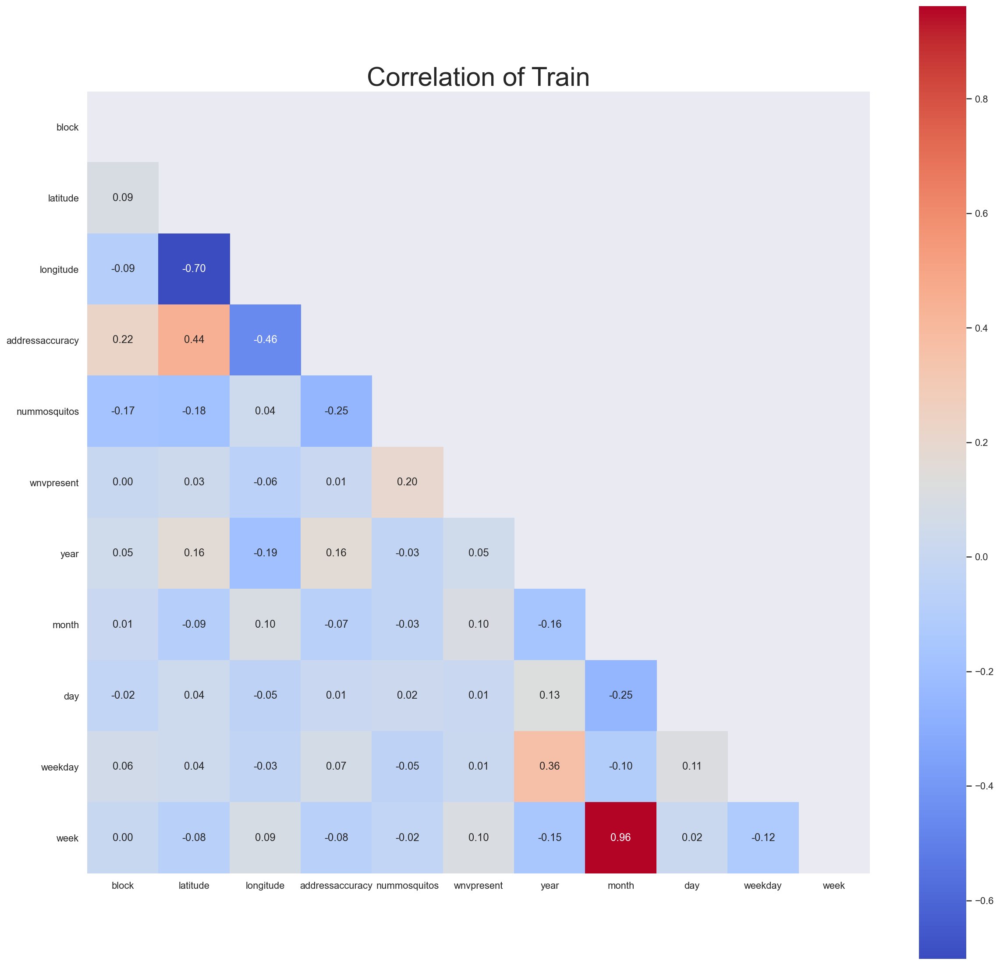

In [ ]:
plt.figure(figsize=(20,20))
mask = np.triu(np.ones_like(train_df.corr(), dtype=bool))
sns.heatmap(train_df.corr(),annot=True, cmap="coolwarm", mask=mask, square=True, fmt='.2f')
plt.title('Correlation of Train', size = 30);

Not much correlation with wnvpresent and other variables in the dataset

In [ ]:
wnv1 = train_df[['month', 'year', 'date', 'wnvpresent']]
wnv1

,month,year,date,wnvpresent
0,5,2007,2007-05-29,0
1,5,2007,2007-05-29,0
2,5,2007,2007-05-29,0
3,5,2007,2007-05-29,0
4,5,2007,2007-05-29,0
...,...,...,...,...
10501,9,2013,2013-09-26,1
10502,9,2013,2013-09-26,0
10503,9,2013,2013-09-26,0
10504,9,2013,2013-09-26,0


In [ ]:
wnv_m = train_df[['date','wnvpresent','year','month','nummosquitos']]

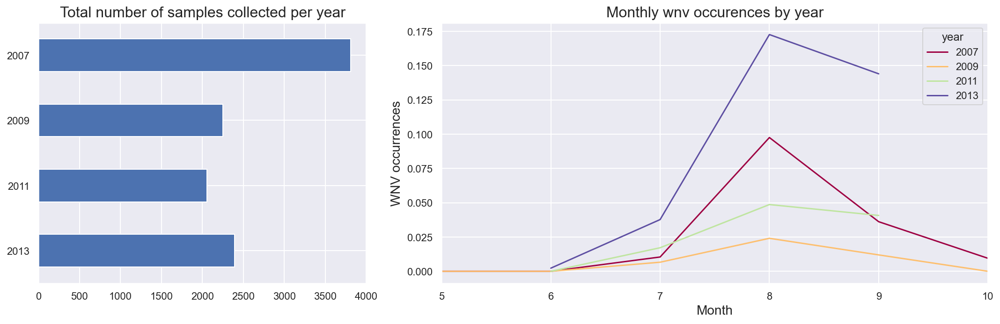

In [ ]:
fig, ax = plt.subplots(ncols = 2, figsize=(15,5),  gridspec_kw={'width_ratios': [3, 5]})

train_df.year.value_counts().sort_index(ascending=False).plot(kind='barh', ax = ax[0])
ax[0].set_title('Total number of samples collected per year', fontsize=16);

sns.lineplot(x= wnv_m.month, y = 'wnvpresent', data = wnv_m, ax = ax[1] ,hue = 'year', ci = None, 
             legend = 'full', palette = 'Spectral');
ax[1].set_title('Monthly wnv occurences by year', fontsize=16)
ax[1].set_xlabel('Month',fontsize=14)
ax[1].set_ylabel('WNV occurrences',fontsize=14)
ax[1].set_xlim(wnv_m.month.min(), wnv_m.month.max())
plt.tight_layout();

Most number of samples are collected on 2007.\
Contradicting with year 2013 which has second highest number of sample, 2013 year have more wnv occurences.

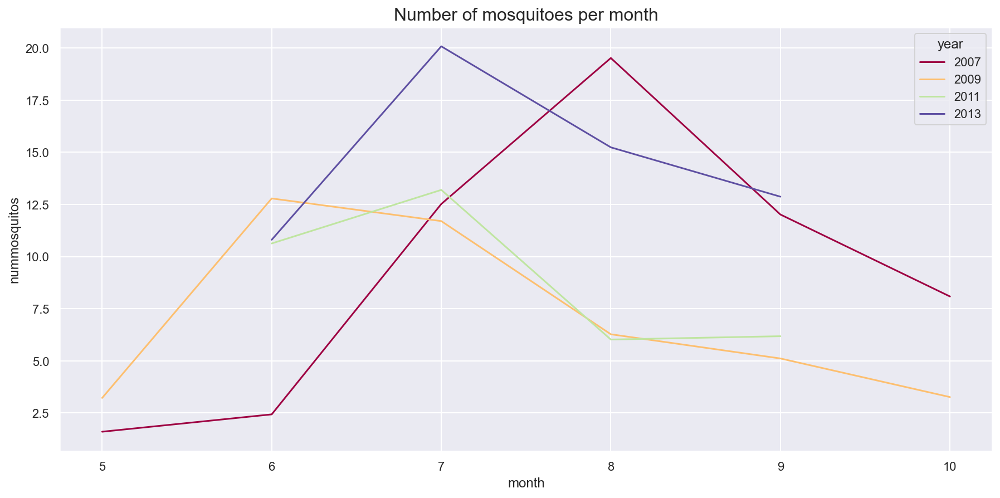

In [ ]:
plt.figure(figsize=(15,7))
sns.lineplot(x= wnv_m.month, y = 'nummosquitos', data = wnv_m ,hue = 'year', ci = None, 
             legend = 'full', palette = 'Spectral');
plt.title('Number of mosquitoes per month', size = 16);


More mosquitos are found in the month of july and august. \
This also means that the higher number of activities could lead to higher number of wnvpresent. 

In [ ]:
wnv_yes= train_df[['species','nummosquitos', 'wnvpresent']].groupby(by='species').sum()
wnv_yes

,nummosquitos,wnvpresent
species,,
CULEX ERRATICUS,7,0
CULEX PIPIENS,44671,240
CULEX PIPIENS/RESTUANS,66268,262
CULEX RESTUANS,23431,49
CULEX SALINARIUS,145,0
CULEX TARSALIS,7,0
CULEX TERRITANS,510,0


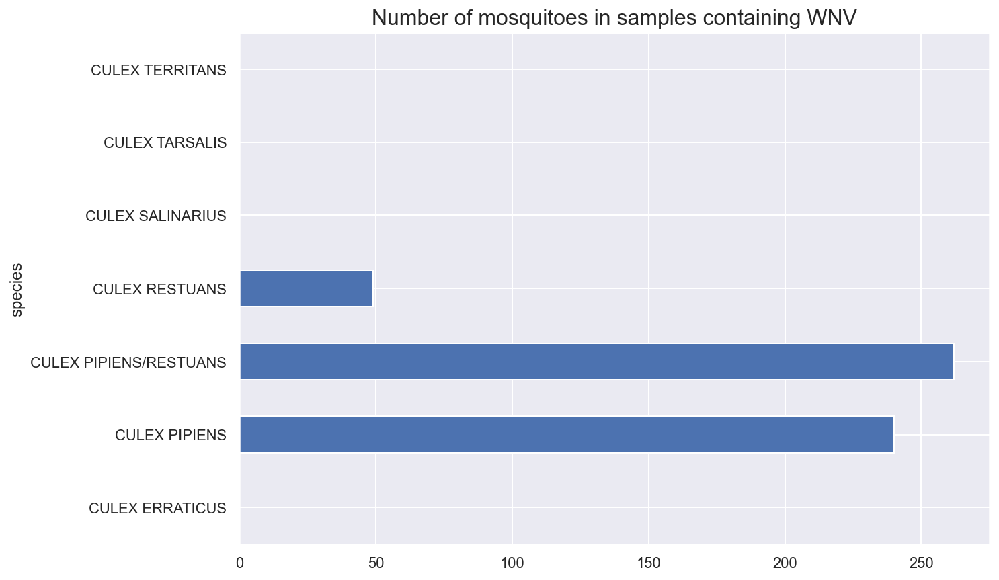

In [ ]:
wnv_yes['wnvpresent'].plot(kind='barh', figsize=(10,7))
plt.title('Number of mosquitoes in samples containing WNV', fontsize=16);

This shows  culex pipiens/resutants species tends to have more wnvpresent 

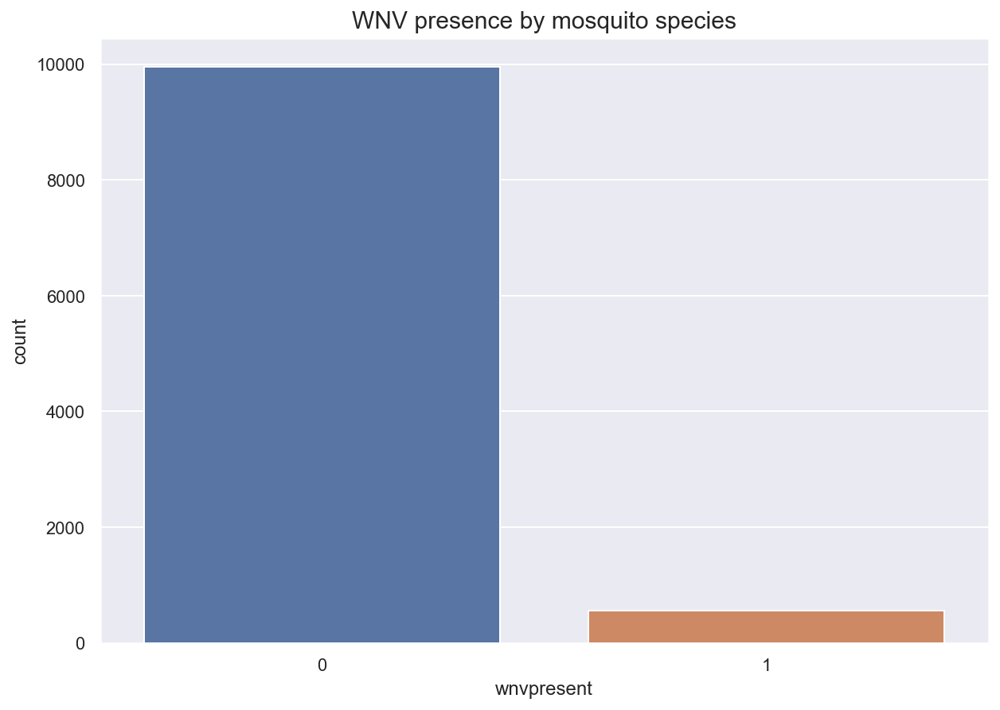

In [ ]:
plt.figure(figsize=(10,7))
sns.countplot(train_df['wnvpresent'])
plt.title('WNV presence by mosquito species', fontsize=15);
#0 means no virus 

This shows that there is a huge imbalance of wnvpresent in the train dataset, with 0 having 1000 and wnvpresent less than 1000.

## Weather EDA

Check out the entries in date format

In [ ]:
ave_temp = pd.pivot_table(weather_df, values='tavg', index=['week'], columns = 'year')
ave_temp

year,2007,2008,2009,2010,2011,2012,2013,2014
week,,,,,,,,
17,NaN,NaN,NaN,63.000000,56.500000,NaN,NaN,NaN
18,59.000000,56.875000,55.500000,56.071429,51.142857,64.333333,57.200000,51.875000
19,64.000000,56.357143,60.857143,54.000000,63.428571,58.785714,56.285714,63.285714
20,61.571429,54.214286,56.285714,62.642857,58.928571,68.214286,67.142857,55.285714
21,67.928571,55.000000,65.357143,75.071429,57.928571,70.785714,60.285714,66.071429
22,73.142857,60.500000,62.785714,69.785714,73.071429,65.714286,67.285714,71.285714
23,67.000000,73.214286,59.428571,68.785714,68.857143,70.428571,61.857143,68.928571
24,77.000000,73.428571,62.142857,73.428571,69.142857,74.857143,70.785714,67.428571
25,71.642857,68.714286,72.285714,76.714286,70.500000,80.142857,72.285714,75.500000


Weather data consists of information from 2007 to 2011, for specific months of May to Oct on a daily basis.

In [ ]:
col = weather_df.columns[4:15]

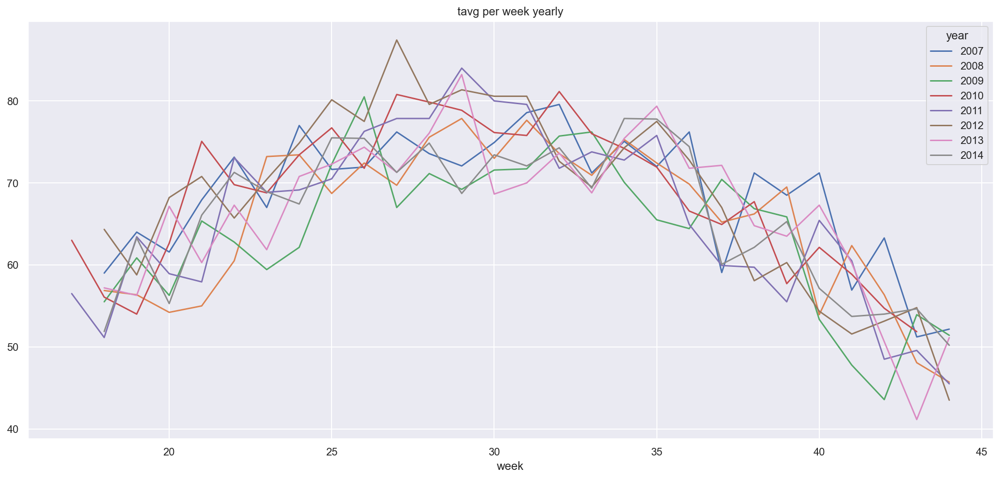

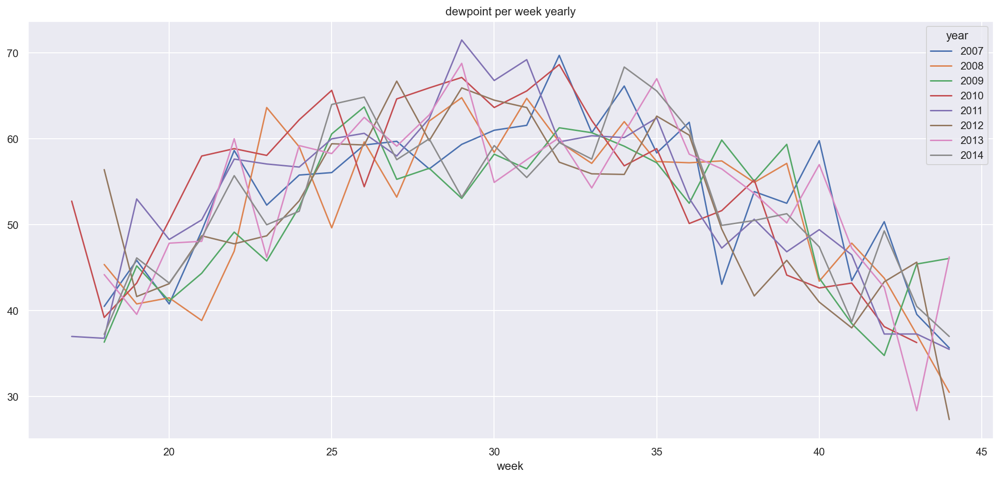

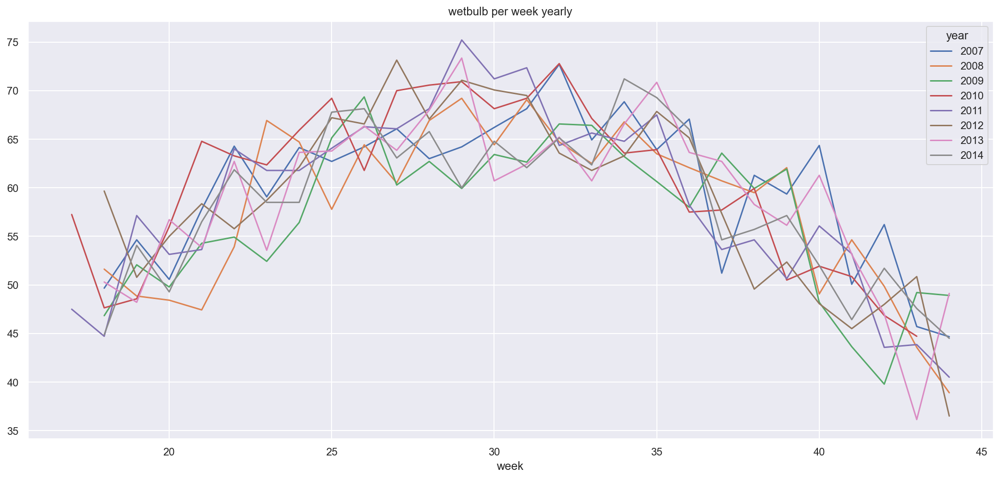

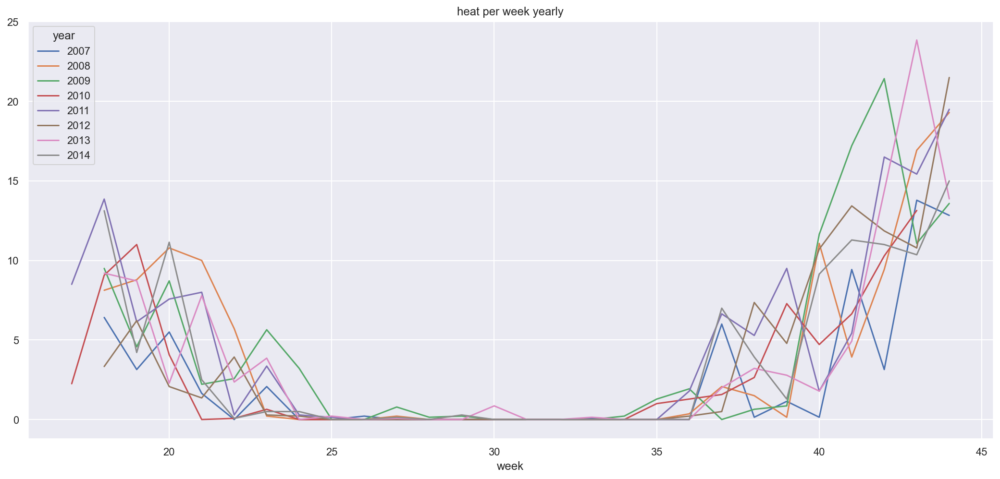

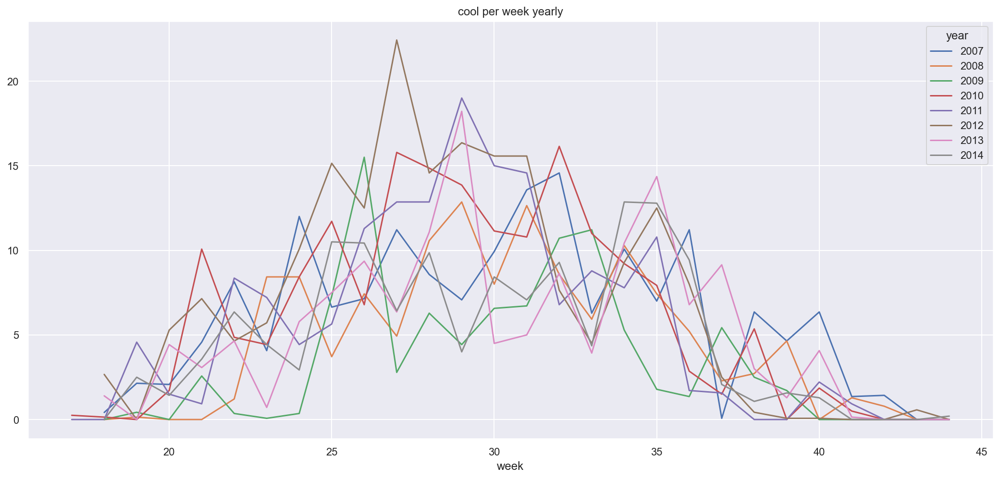

...

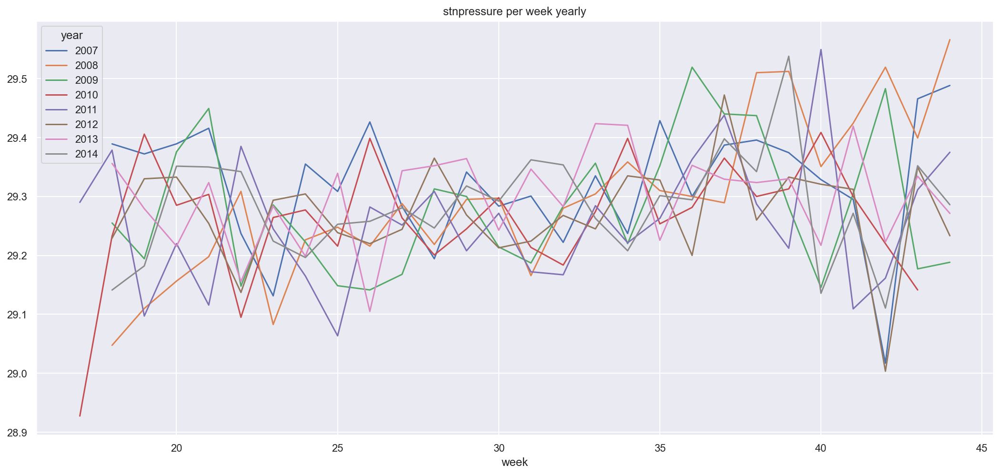

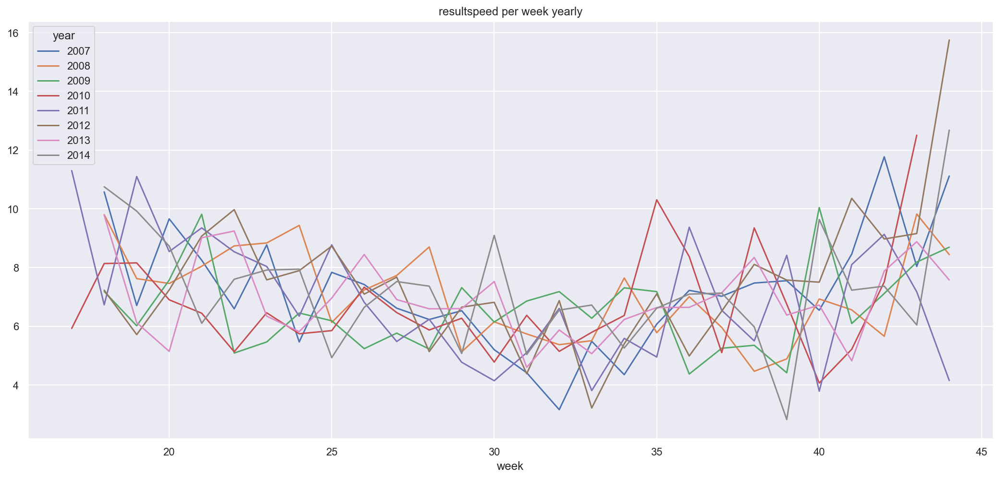

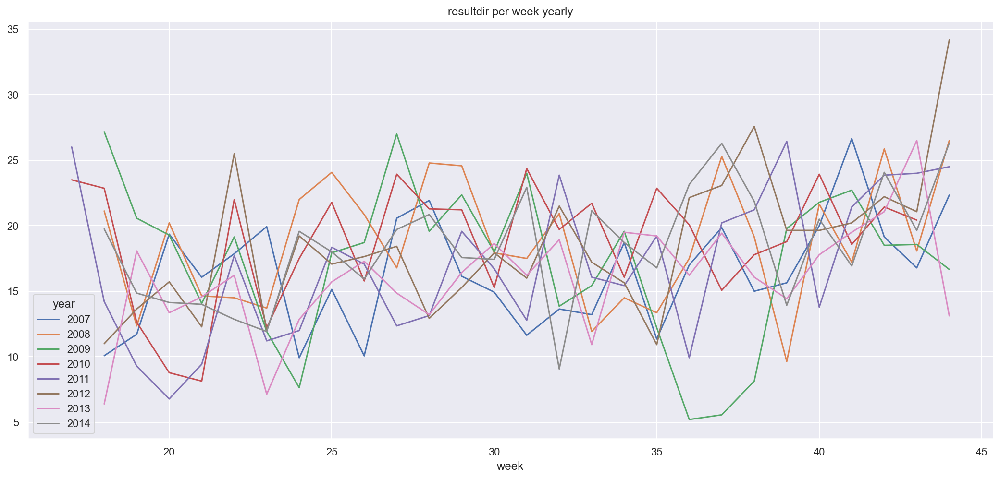

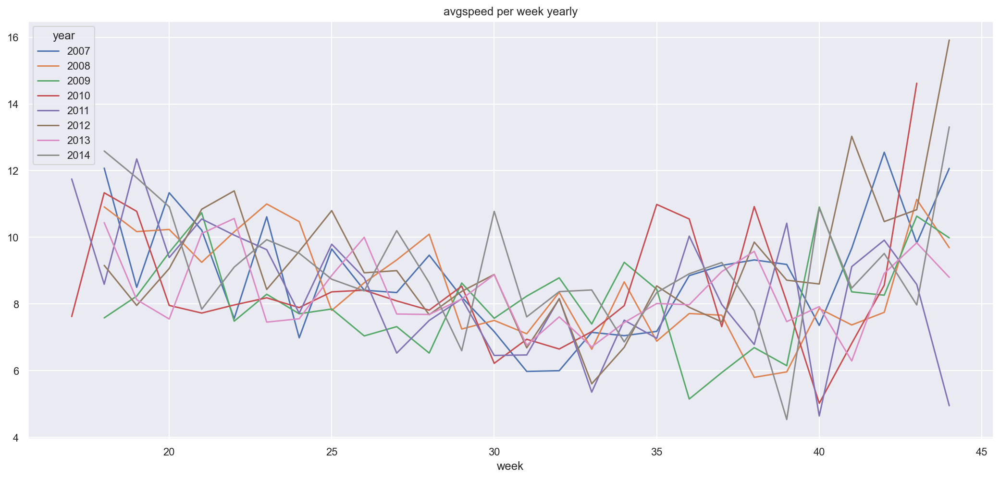

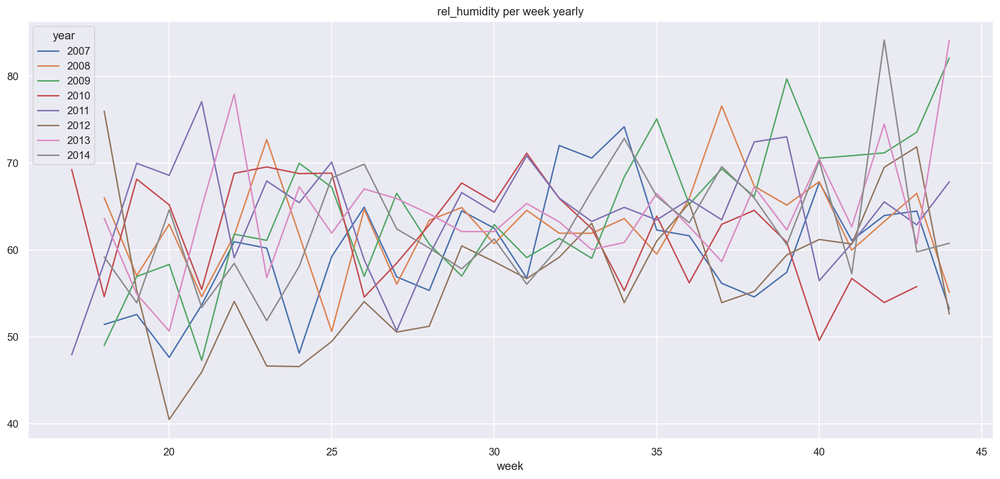

In [ ]:
for i in col:
    i_title =  i + ' per week yearly'
    pd.pivot_table(weather_df, values=i, index='week', columns = 'year').plot(figsize=(18,8), title=i_title)
    #view variables of weather per week

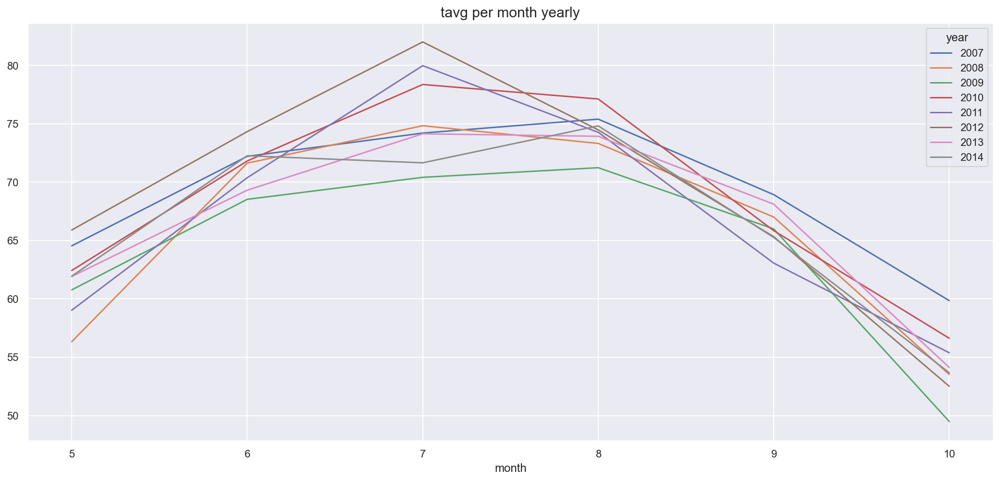

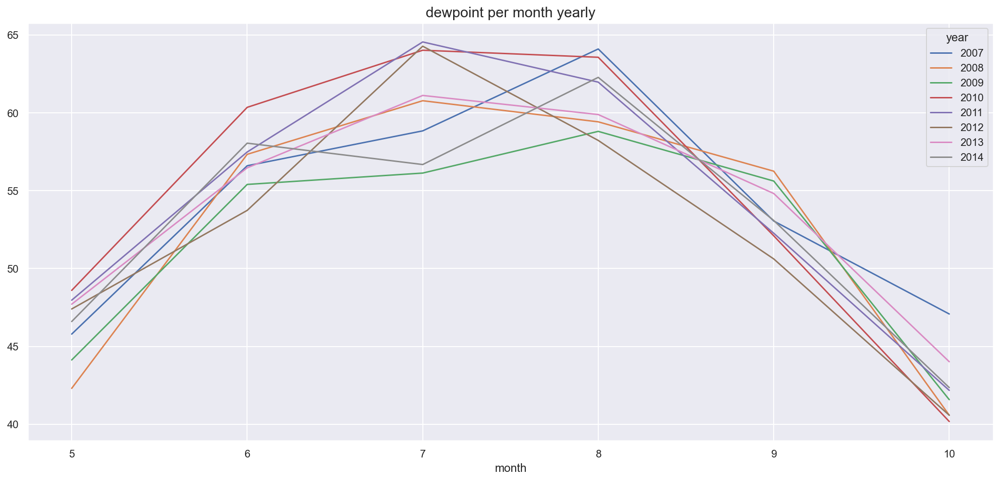

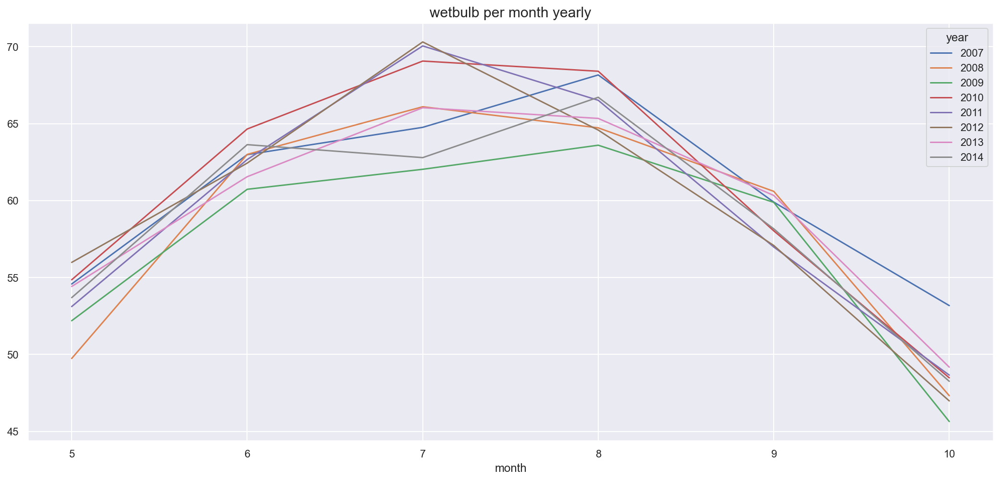

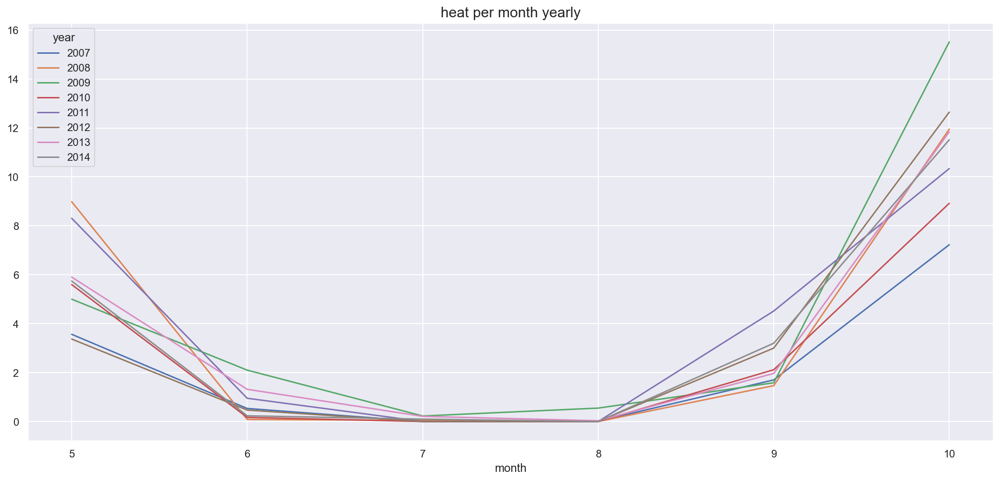

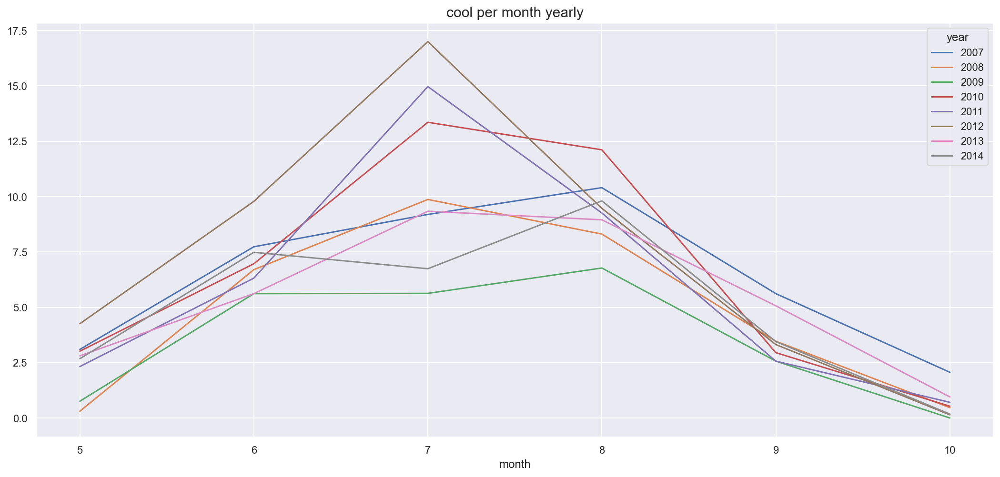

...

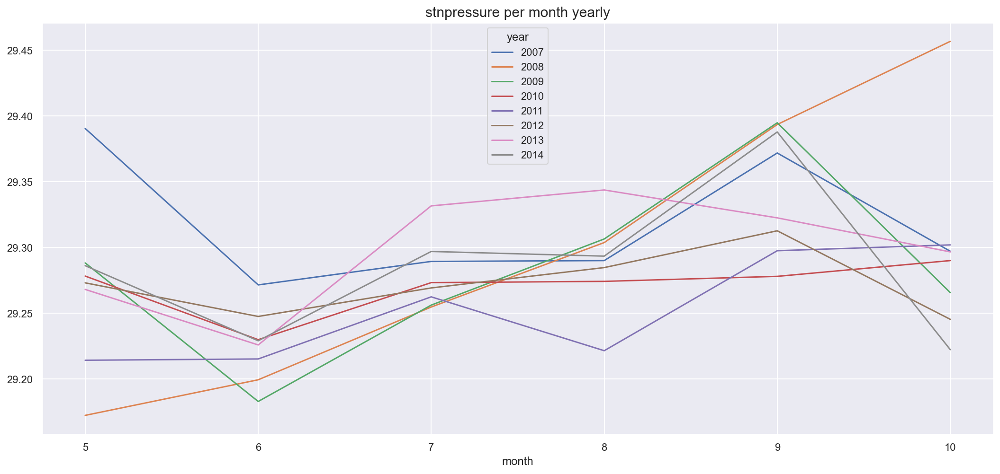

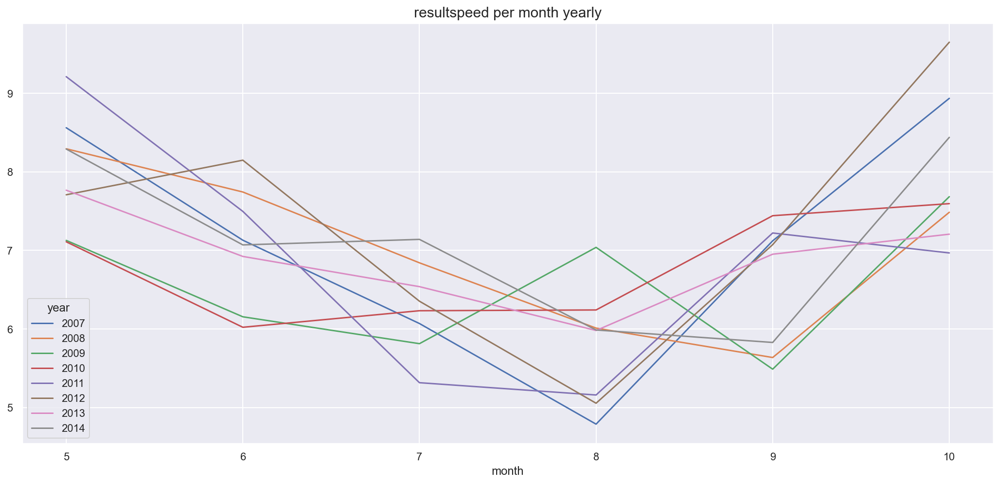

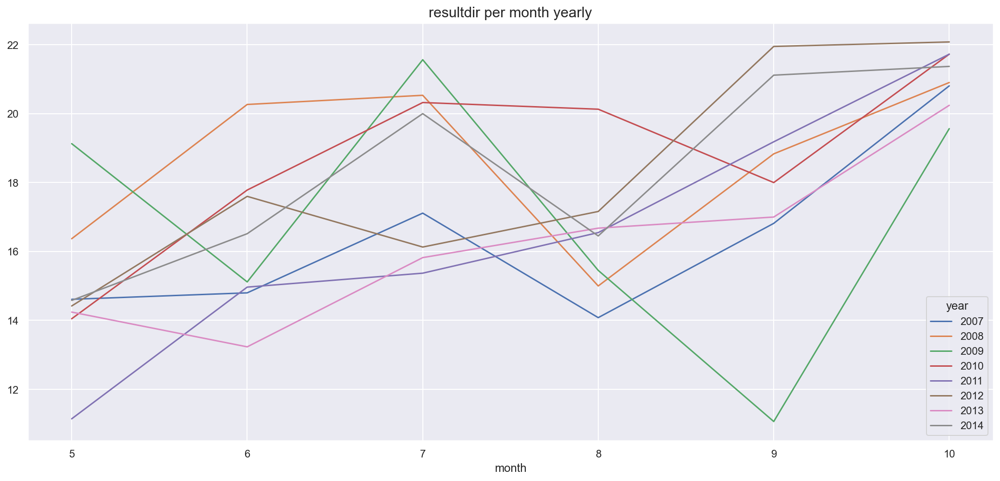

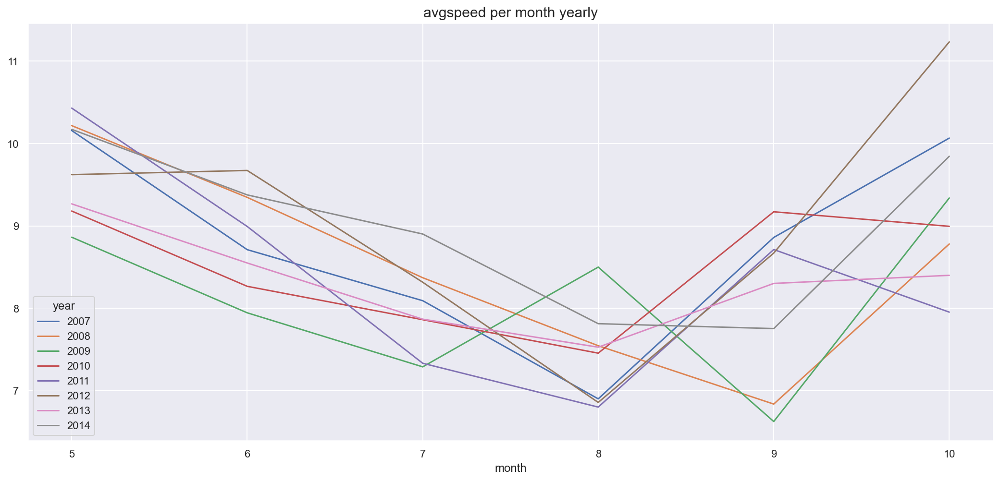

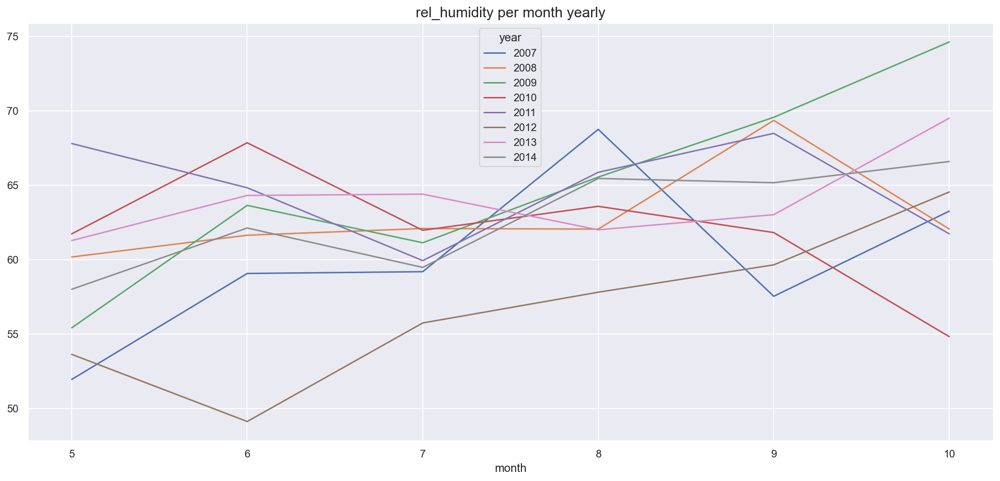

In [ ]:
for i in col:
    i_title =  i + ' per month yearly'
    pd.pivot_table(weather_df, values=i, index='month', columns = 'year').plot(figsize=(18,8))
    plt.title(i_title, size= 15)
    #view variables of weather per month

This shows that certain variables in weather do peak especially in the weeks that is in july and august. \
Weather perhaps do play a part in mosquito activity as based on findings, rainfall humidity and high temperature favours their breeding and activity. \
And in the the graphs in July-August , those variables are found to be higher comparing to other months.

In [ ]:
#separate to station 1 and station2
station1 = weather_df[weather_df['station']==1].copy()
station2 = weather_df[weather_df['station']==2].copy()

In [ ]:
station1.reset_index(inplace=True, drop=True)
station2.reset_index(inplace=True, drop=True)

In [ ]:
def unpaired_t_test(x1, x2):

  stat, p = ttest_ind(x1, x2)
  print(f'stat = {stat:.3f}, p = {p:.3f}')
  if p > 0.05:
    print('p>0.05. Do not reject H0, and the means of the samples are equal')
  else:
    print('p<0.05. Reject H0, and the means of the samples are not equal')

In [ ]:
col = weather_df.columns[2:15]

In [ ]:
for i in col:
  print(i)
  unpaired_t_test(station1[i], station2[i])
  print('\n')

tmax
stat = -0.886, p = 0.376
p>0.05. Do not reject H0, and the means of the samples are equal


tmin
stat = -5.671, p = 0.000
p<0.05. Reject H0, and the means of the samples are not equal


tavg
stat = -3.197, p = 0.001
p<0.05. Reject H0, and the means of the samples are not equal


dewpoint
stat = -0.407, p = 0.684
p>0.05. Do not reject H0, and the means of the samples are equal


wetbulb
stat = -1.589, p = 0.112
p>0.05. Do not reject H0, and the means of the samples are equal


heat
stat = 1.967, p = 0.049
p<0.05. Reject H0, and the means of the samples are not equal


cool
stat = -3.605, p = 0.000
p<0.05. Reject H0, and the means of the samples are not equal


preciptotal
stat = 0.457, p = 0.648
p>0.05. Do not reject H0, and the means of the samples are equal


stnpressure
stat = -10.541, p = 0.000
p<0.05. Reject H0, and the means of the samples are not equal


resultspeed
stat = 0.400, p = 0.689
p>0.05. Do not reject H0, and the means of the samples are equal


resultdir
stat = 0.

It appears that station 1 and station 2 weather parameters are mostly equivalent, with the exception of tmin, tavg, heat, cool, station pressure, relative humidity.

### Plot the weekly data for station 1

In [ ]:
for i in col:
  pd.pivot_table(station1, values=i, index='week', columns = 'year').plot(
      figsize=(15,8), title=i)

Output hidden; open in https://colab.research.google.com to view.

### Plot the weekly data for station 2

In [ ]:
for i in col:
    i_title = 'weekly '+ i
    pd.pivot_table(station2, values=i, index='week', columns = 'year').plot(
      figsize=(15,7), title= i_title)
    plt.ylabel(i)

Output hidden; open in https://colab.research.google.com to view.

### Looking at the weather parameters over the years

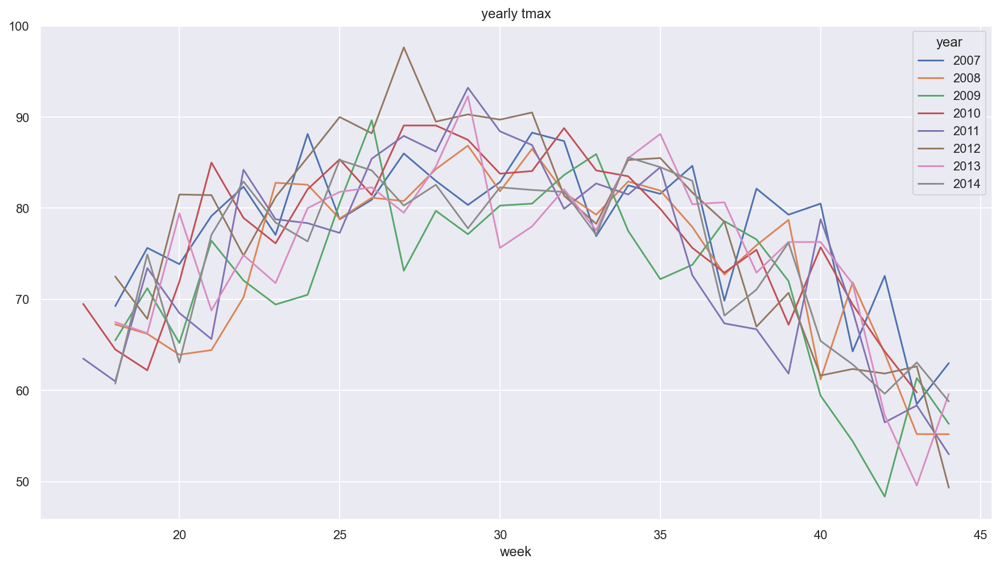

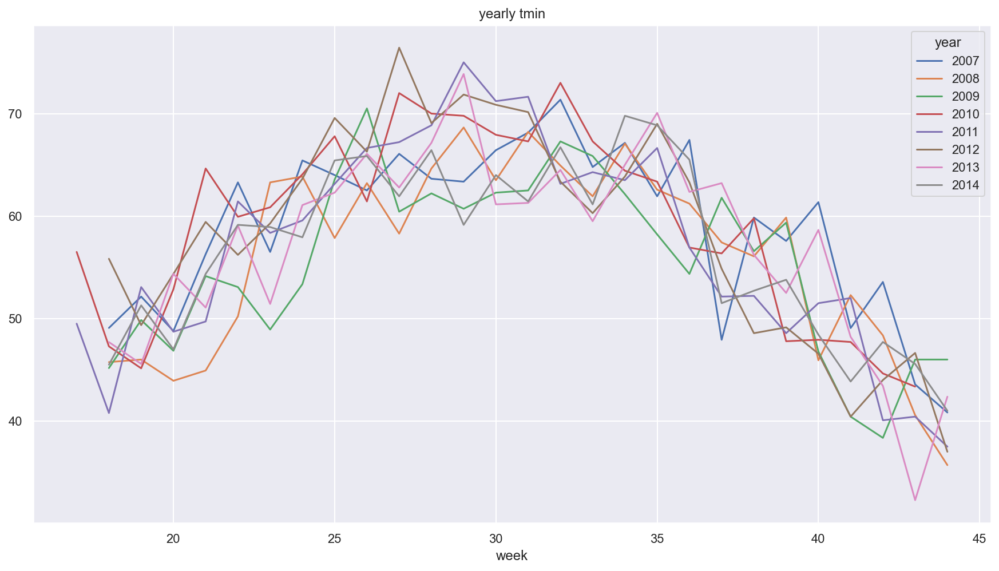

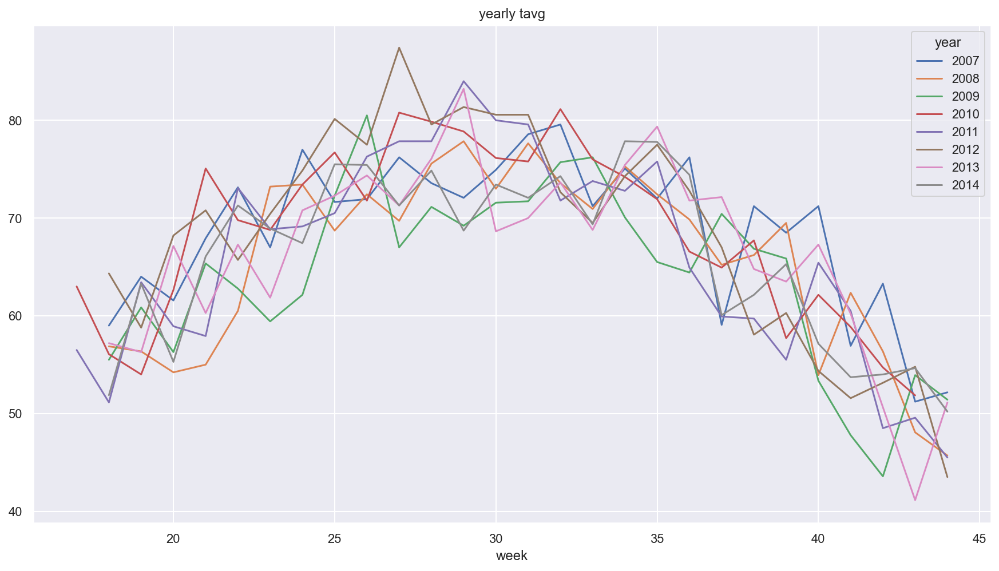

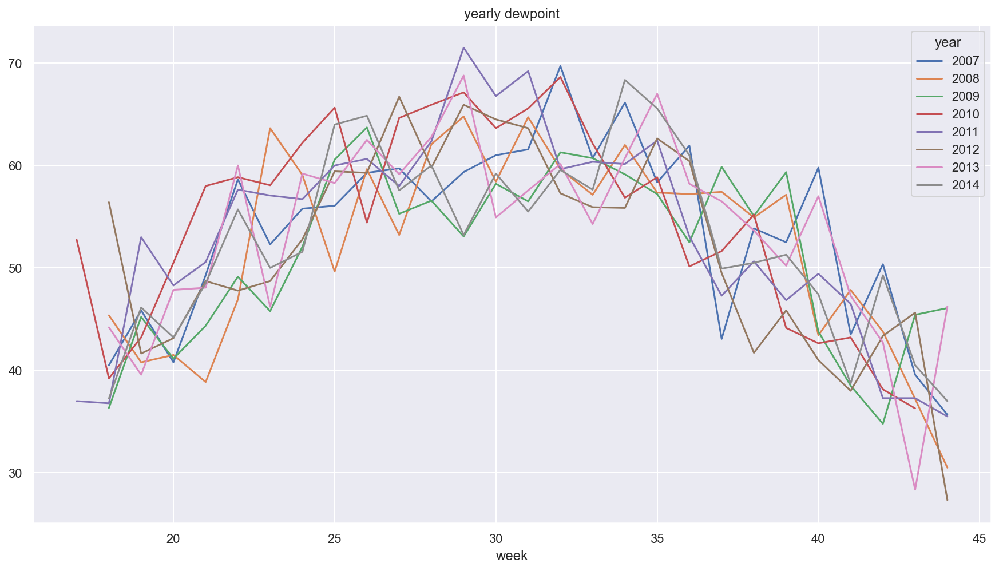

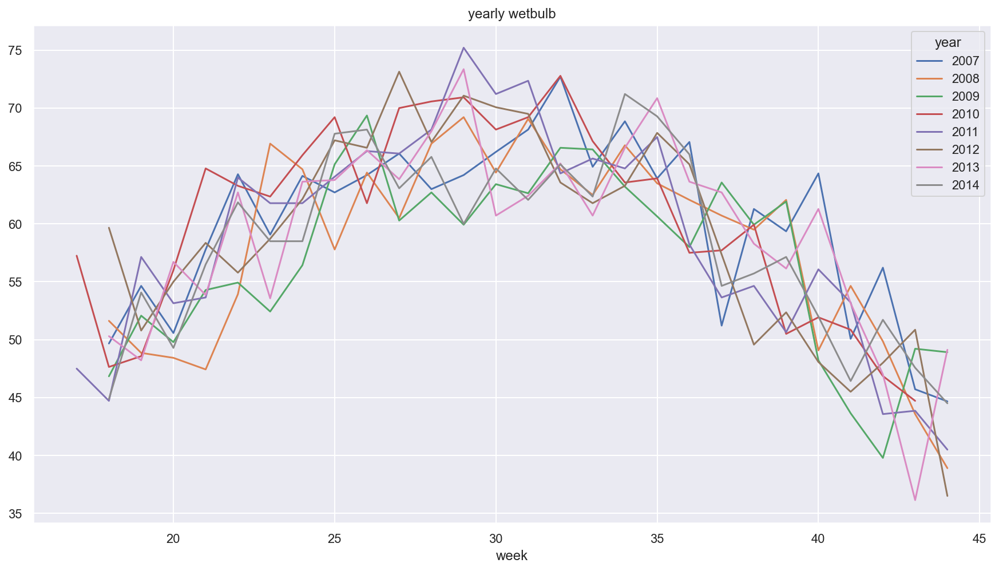

...

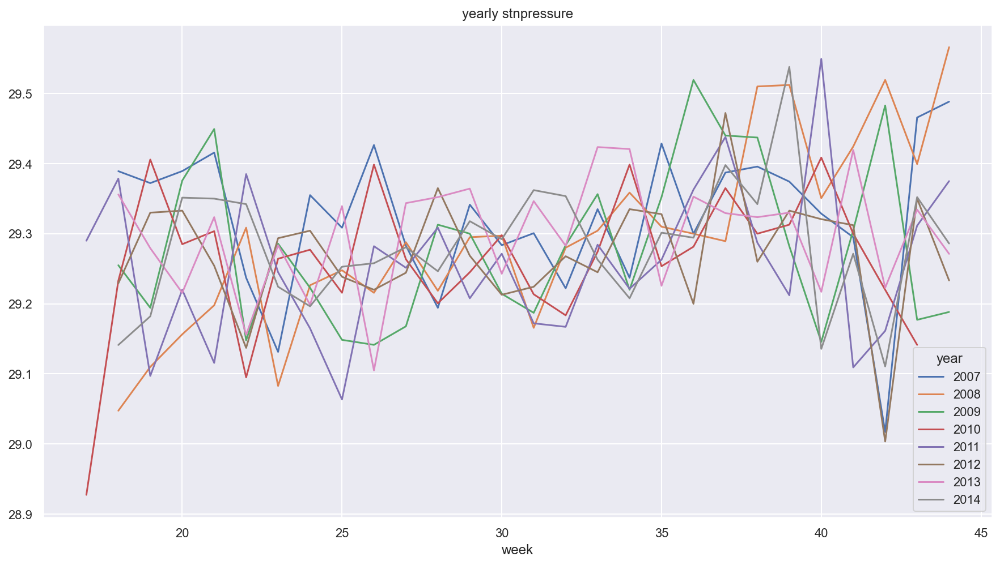

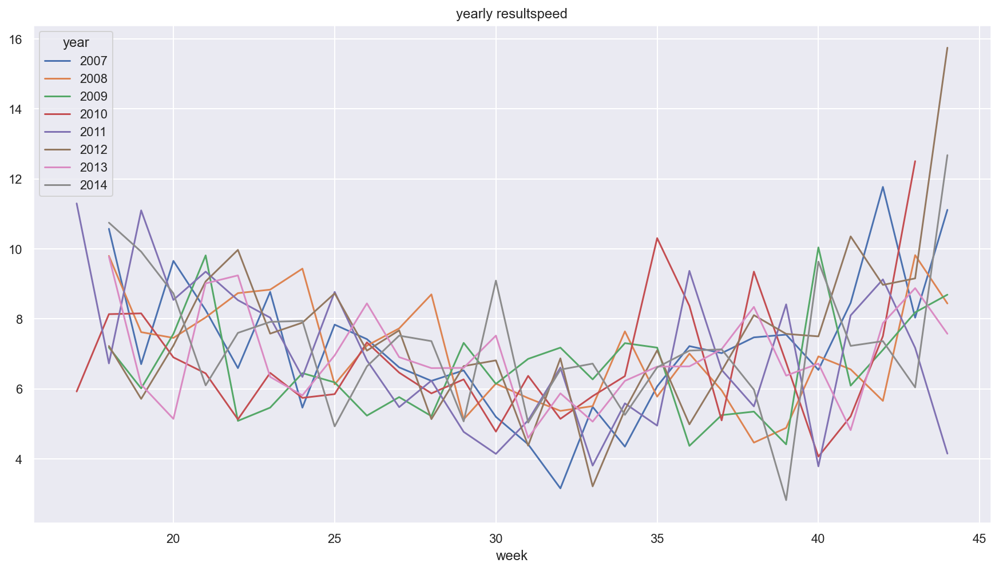

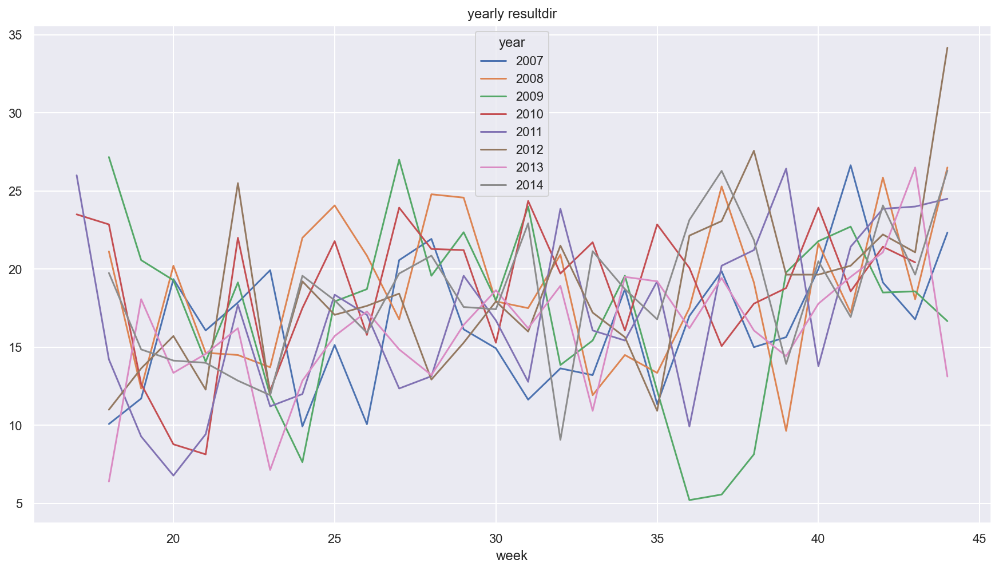

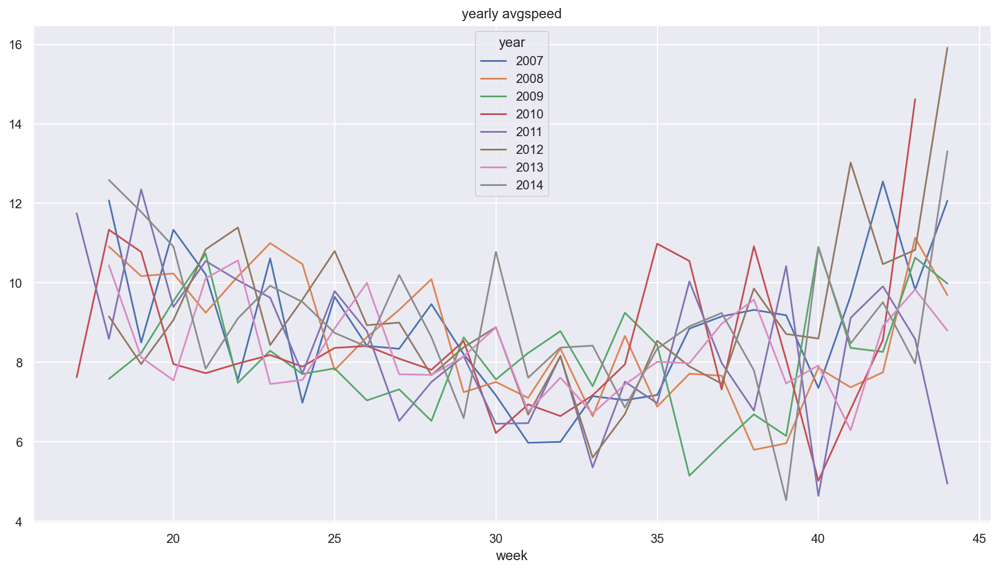

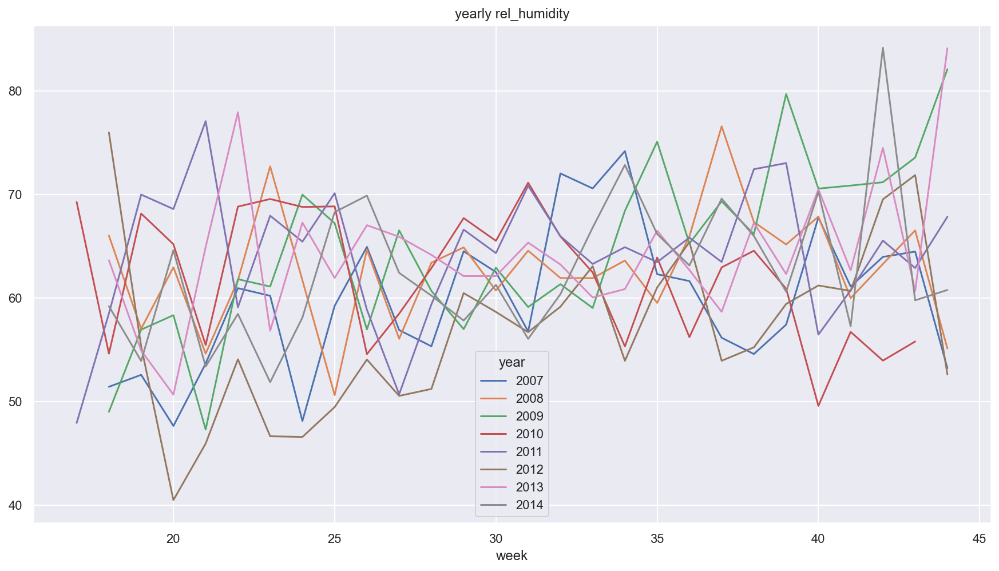

In [ ]:
for i in col:
    i_title = 'yearly '+ i
    pd.pivot_table(weather_df, values=i, index='week', columns = 'year').plot( figsize=(15,8), title= i_title)

### Looking at the weather parameters over weeks

In [ ]:
pd.pivot_table(weather_df, values=i, index='year', columns = 'week')

week,17,18,19,20,21,22,23,24,25,26,...,35,36,37,38,39,40,41,42,43,44
year,,,,,,,,,,,,,,,,,,,,,
2007,NaN,51.423974,52.577728,47.642643,53.667589,60.948302,60.214697,48.118143,59.244591,64.936134,...,62.295374,61.635705,56.161971,54.589116,57.429994,67.771874,61.105795,63.967477,64.482471,53.227474
2008,NaN,66.028034,57.032209,62.965226,54.625568,61.698976,72.708509,61.710575,50.621456,64.684564,...,59.524332,65.946550,76.579570,67.339923,65.170200,67.864767,59.987262,63.284220,66.523173,55.125156
2009,NaN,49.016867,56.944159,58.337791,47.295413,61.819100,61.106808,69.983351,67.221032,56.959653,...,75.091954,65.261293,69.336800,66.168253,79.689582,70.565486,70.857123,71.180656,73.561281,82.095825
2010,69.266750,54.626971,68.156220,65.194123,55.453923,68.824115,69.560333,68.791776,68.844808,54.578710,...,63.910636,56.220342,62.955210,64.564325,60.892672,49.581208,56.725842,53.953117,55.795222,NaN
2011,47.934006,58.506055,69.985170,68.591996,77.079881,59.103132,67.946378,65.441017,70.118162,58.866060,...,63.465332,65.828397,63.479367,72.438781,73.028397,56.465922,60.738296,65.546270,62.894815,67.842826
2012,NaN,75.984033,55.341168,40.482994,45.942608,54.081826,46.649054,46.580674,49.468013,54.057162,...,61.014915,65.394104,53.938573,55.235283,59.425349,61.208632,60.685259,69.526202,71.867939,52.628023
2013,NaN,63.643019,54.925980,50.665989,64.927359,77.937411,56.831739,67.279489,61.934907,67.030515,...,66.500378,62.697439,58.667743,67.264728,62.313810,70.496633,62.667306,74.498494,60.687039,84.121527
2014,NaN,59.207459,53.921685,64.622364,53.380049,58.459519,51.870434,58.108670,68.293048,69.885957,...,66.179541,63.140937,69.595705,65.986479,60.610466,70.238509,57.272463,84.171861,59.776866,60.776483


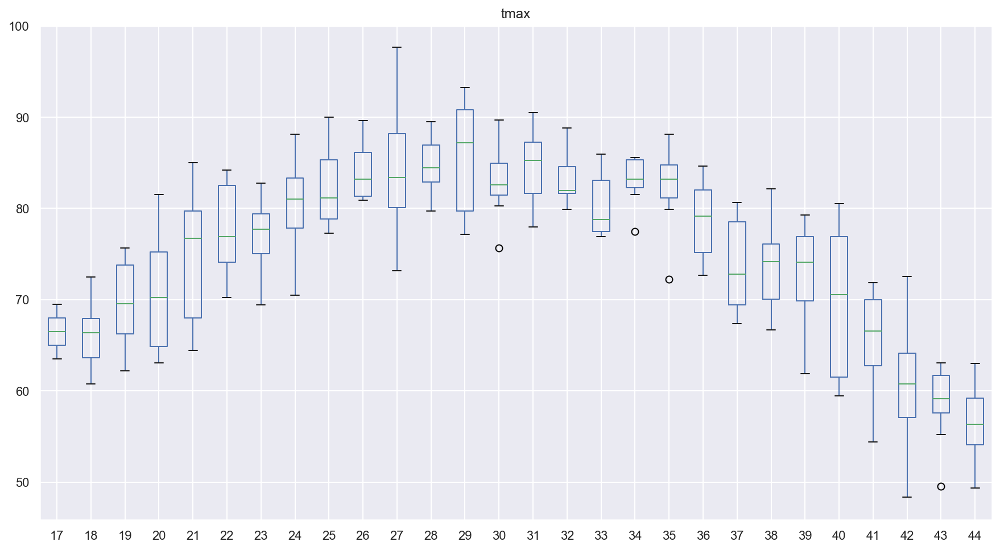

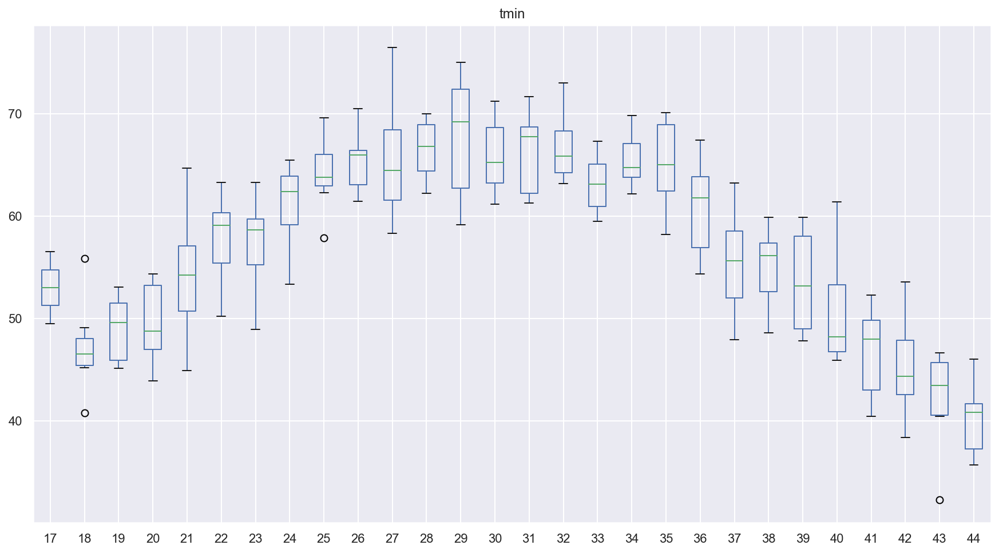

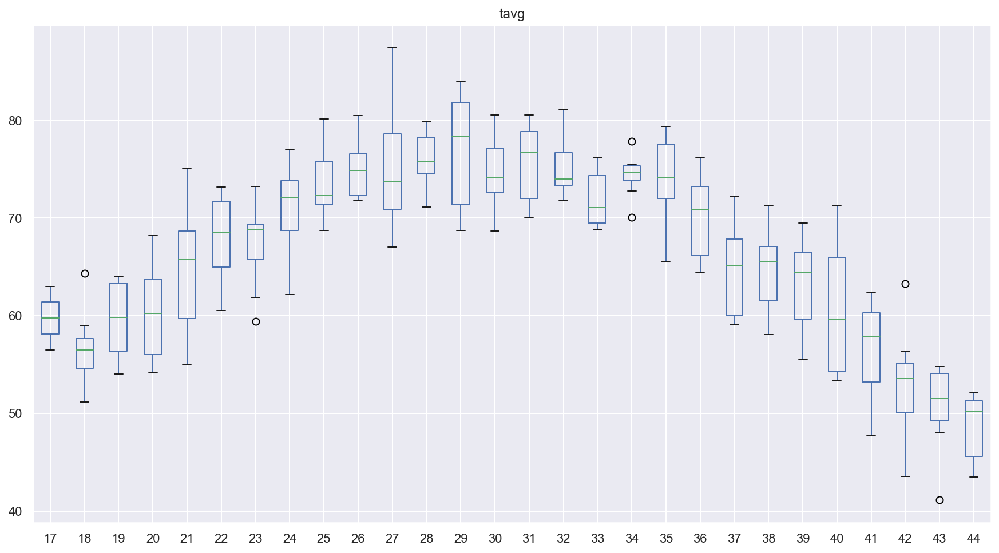

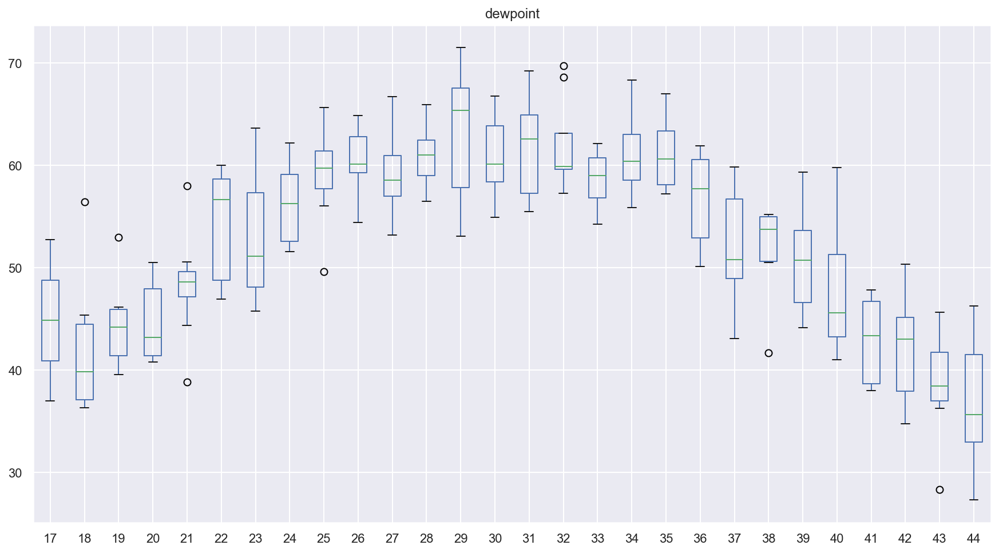

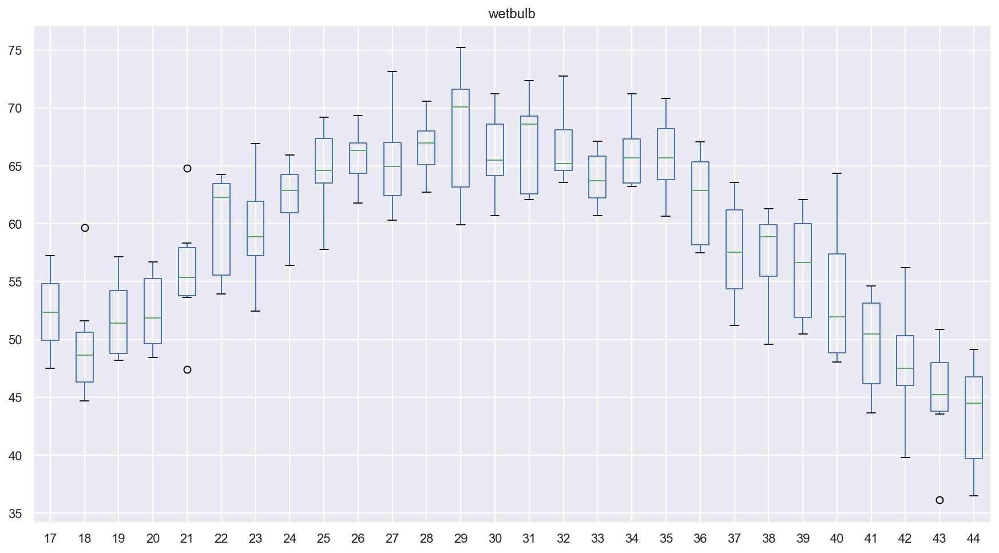

...

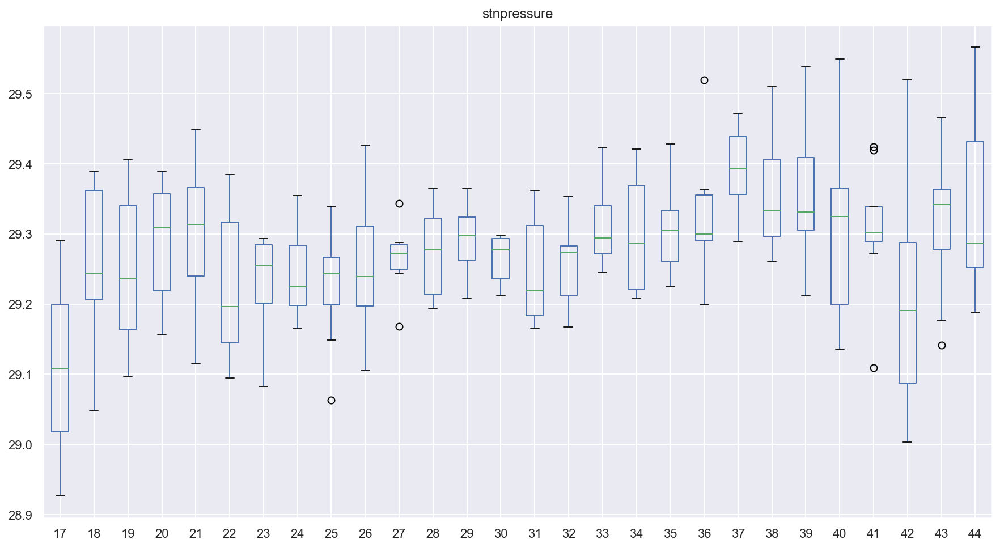

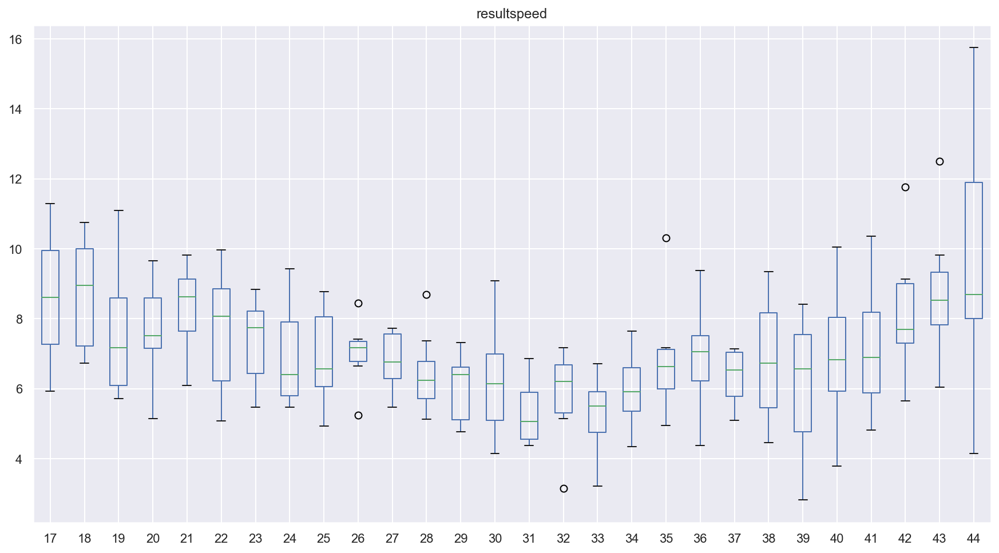

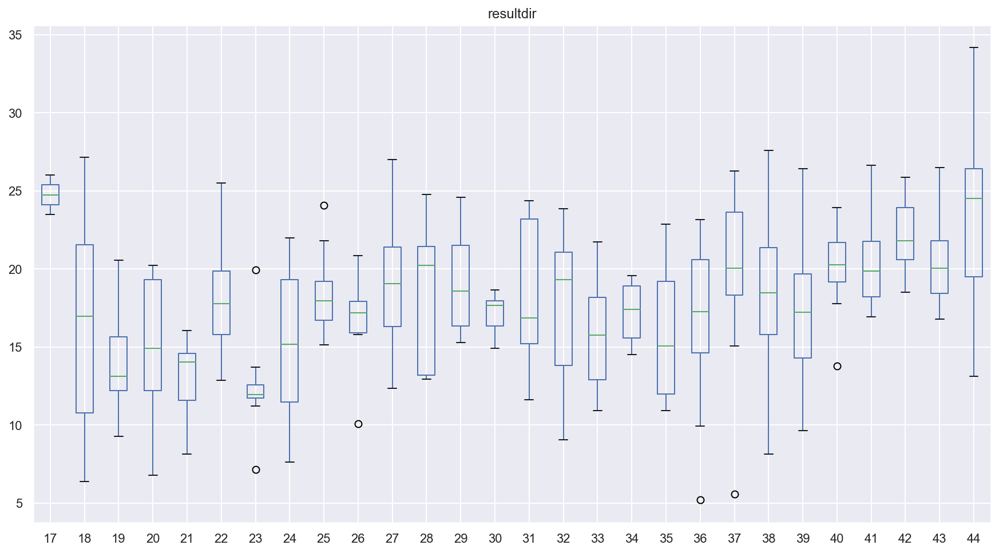

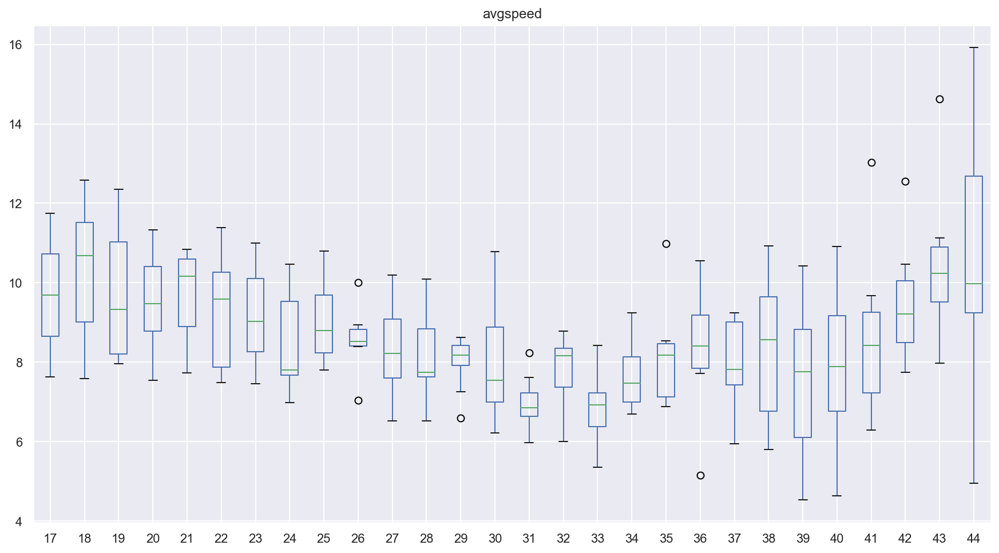

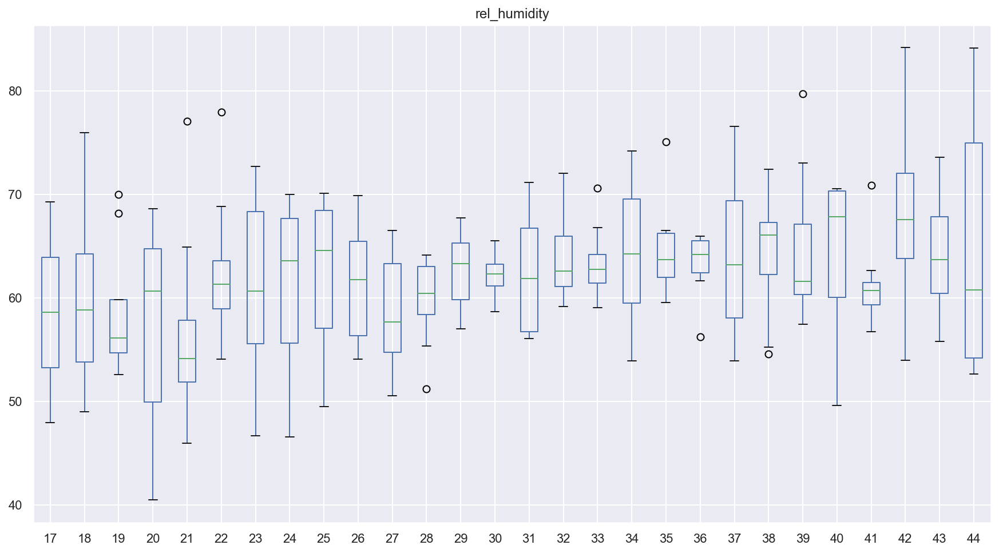

In [ ]:
for i in col:
  pd.pivot_table(weather_df, values=i, index='year', columns = 'week').plot(
      kind='box', figsize=(15,8), title=i)

### Compare station 1 and station 2 time series.

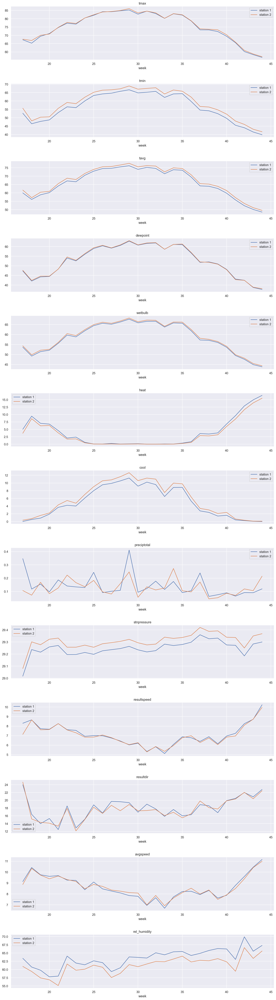

In [ ]:
fig, ax = plt.subplots(nrows=len(col), figsize=(15,50))
fig.tight_layout(pad=5)
for i in range(len(col)):
  ax[i].set_title(str(col[i]))
  pd.pivot_table(station1, values=col[i], index='week').plot(ax=ax[i])
  pd.pivot_table(station2, values=col[i], index='week').plot(ax=ax[i])
  ax[i].legend(('station 1', 'station 2'))

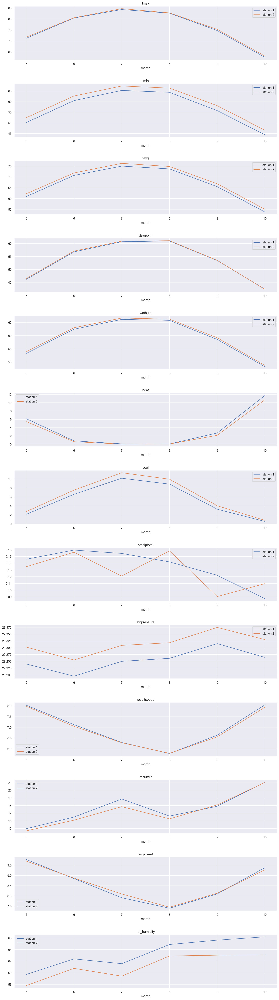

In [ ]:
fig, ax = plt.subplots(nrows=len(col), figsize=(15,50))
fig.tight_layout(pad=5)
for i in range(len(col)):
  ax[i].set_title(str(col[i]))
  pd.pivot_table(station1, values=col[i], index='month').plot(ax=ax[i])
  pd.pivot_table(station2, values=col[i], index='month').plot(ax=ax[i])
  ax[i].legend(('station 1', 'station 2'))

### Overall correlation heatmap

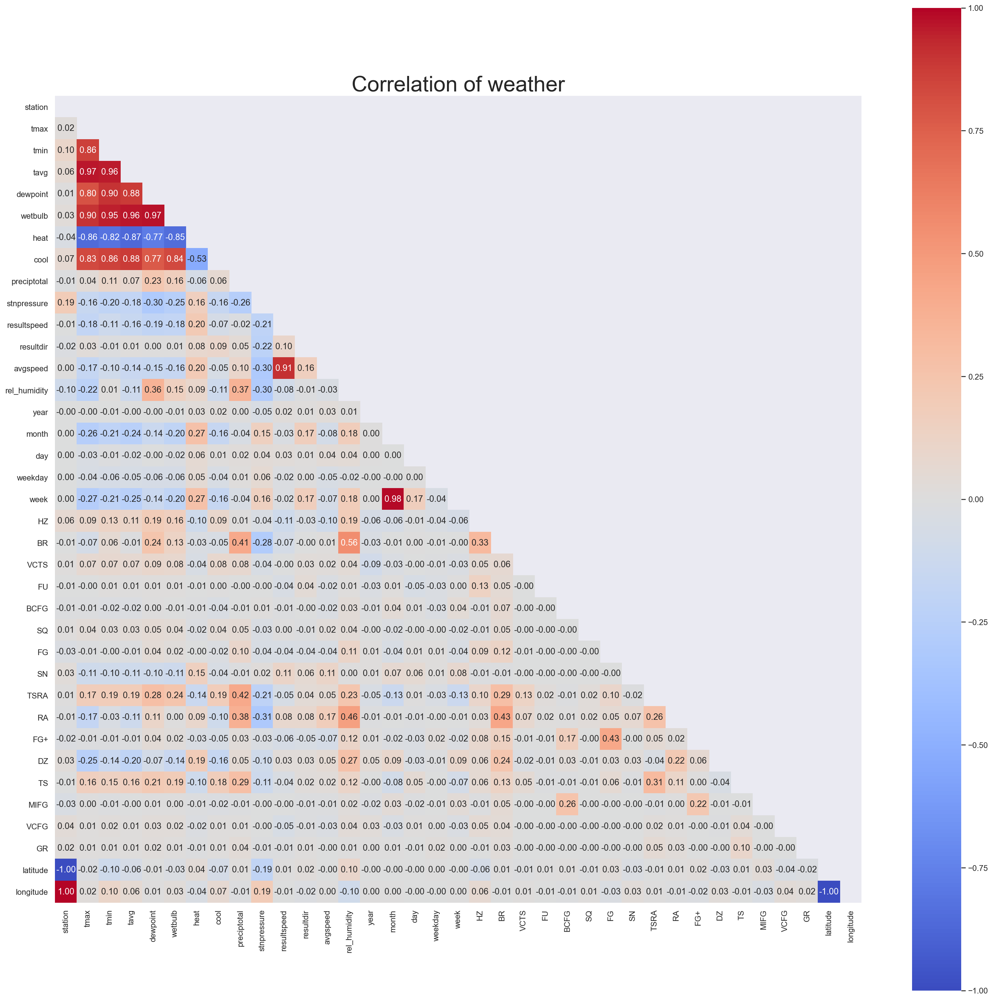

In [ ]:
plt.figure(figsize=(25,25))
mask = np.triu(np.ones_like(weather_df.corr(), dtype=bool))
sns.heatmap(weather_df.corr(),annot=True, cmap="coolwarm", mask=mask, square=True, fmt='.2f')
plt.title('Correlation of weather', size = 30);

From codesum,seems like'BCFG','FG+','FU','GR','MIFG','SN','SQ','VCFG','TS' are really insignificant. Will drop accordingly \
Following observations are found:
- Tmin and tmax are highly correlated with tvage. For modelling, requires only one. Will drop tmin and tmax
- Dewpoint and wetbulb are also high correlated but because they are not similar in terms of definition and are found to influence the breed of mosquitos, will keep them
- Avgspeed and result speed are highly correlated. To observe further

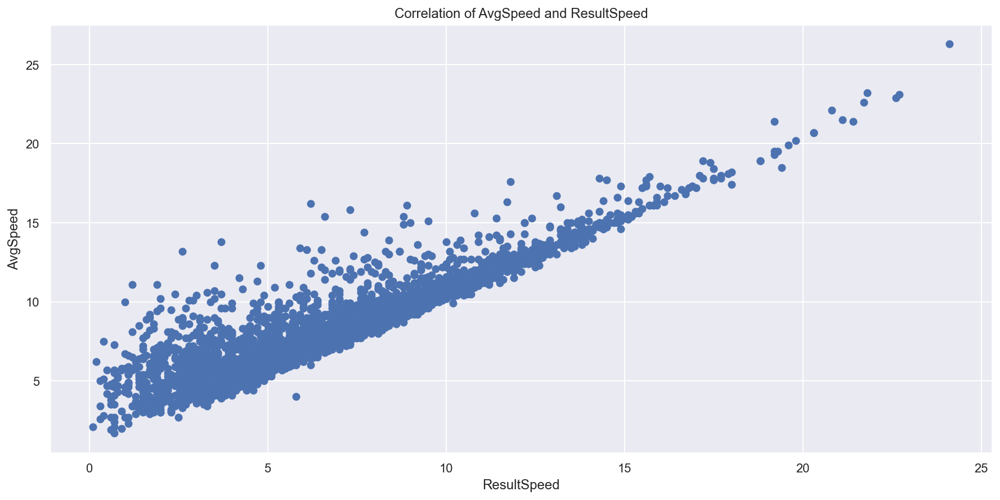

In [ ]:
plt.figure(figsize=(15,7))
plt.scatter(weather_df['resultspeed'], weather_df['avgspeed'] )
plt.xlabel('ResultSpeed')
plt.ylabel('AvgSpeed')
plt.title('Correlation of AvgSpeed and ResultSpeed');

Similarly, 'ResultSpeed' (x axis) and 'AvgSpeed' (y axis) are closely linearly correlated.
As both are closely linearly correlated and only require one type of speed for modelling, we only need one of them (the other can be dropped) for modelling. Will drop 'ResultSpeed'

## Export cleaned data as csv

Export to the clean weather csv 

In [ ]:
weather_df.drop(['BCFG','FG+','FU','GR','MIFG','SN','SQ','VCFG','TS','resultspeed','day','tmin','tmax'],axis=1,inplace=True)
#dropping columns that was mention previously from observations

In [ ]:
weather_df.head()

,station,date,tavg,dewpoint,wetbulb,heat,cool,preciptotal,stnpressure,resultdir,...,week,HZ,BR,VCTS,FG,TSRA,RA,DZ,latitude,longitude
0,1,2007-05-01,67.0,51,56.0,0.0,2.0,0.0,29.10,27,...,18,0,0,0,0,0,0,0,41.995,-87.933
1,2,2007-05-01,68.0,51,57.0,0.0,3.0,0.0,29.18,25,...,18,0,0,0,0,0,0,0,41.786,-87.752
2,1,2007-05-02,51.0,42,47.0,14.0,0.0,0.0,29.38,4,...,18,0,1,0,0,0,0,0,41.995,-87.933
3,2,2007-05-02,52.0,42,47.0,13.0,0.0,0.0,29.44,2,...,18,1,1,0,0,0,0,0,41.786,-87.752
4,1,2007-05-03,56.0,40,48.0,9.0,0.0,0.0,29.39,7,...,18,0,0,0,0,0,0,0,41.995,-87.933


In [ ]:
weather_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2944 entries, 0 to 2943
Data columns (total 26 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   station       2944 non-null   int64         
 1   date          2944 non-null   datetime64[ns]
 2   tavg          2944 non-null   float64       
 3   dewpoint      2944 non-null   int64         
 4   wetbulb       2944 non-null   float64       
 5   heat          2944 non-null   float64       
 6   cool          2944 non-null   float64       
 7   preciptotal   2944 non-null   float64       
 8   stnpressure   2944 non-null   float64       
 9   resultdir     2944 non-null   int64         
 10  avgspeed      2944 non-null   float64       
 11  rel_humidity  2944 non-null   float64       
 12  year          2944 non-null   int64         
 13  month         2944 non-null   int64         
 14  weekday       2944 non-null   int64         
 15  day_name      2944 non-null   object  

In [ ]:
weather_df.to_csv('../assets/weather_clean.csv', index=False)

### Aggregate weather data into week basis for export

In [ ]:
weather_df.columns[2:14]

Index(['tavg', 'dewpoint', 'wetbulb', 'heat', 'cool', 'preciptotal',
       'stnpressure', 'resultdir', 'avgspeed', 'rel_humidity', 'year',
       'month'],
      dtype='object')

In [ ]:
weather2 = weather_df.groupby(['year', 'week', 'station'])[weather_df.columns[2:15]].mean()
weather2.head()
#get the weekly average weather data

tavg   dewpoint    wetbulb      heat      cool  \
year week station                                                        
2007 18   1        58.500000  40.333333  49.333333  6.833333  0.333333   
          2        59.500000  40.666667  50.000000  6.000000  0.500000   
     19   1        63.428571  45.857143  54.571429  3.285714  1.714286   
          2        64.571429  45.857143  54.714286  3.000000  2.571429   
     20   1        61.571429  41.000000  50.571429  5.571429  2.142857   

                   preciptotal  stnpressure  resultdir   avgspeed  \
year week station                                                   
2007 18   1           0.001667    29.358333  10.666667  12.050000   
          2           0.000833    29.420000   9.500000  12.100000   
     19   1           0.019286    29.341429  10.714286   8.642857   
          2           0.003571    29.402857  12.714286   8.357143   
     20   1           0.084286    29.355714  20.000000  11.814286   

                   rel_humidity    year  month  weekday  
year week station                                        
2007 18   1           52.054022  2007.0    5.0      3.5  
          2           50.793926  2007.0    5.0      3.5  
     19   1           53.524463  2007.0    5.0      3.0  
          2           51.630993  2007.0    5.0      3.0  
     20   1           48.001934  2007.0    5.0      3.0

In [ ]:
weather_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2944 entries, 0 to 2943
Data columns (total 26 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   station       2944 non-null   int64         
 1   date          2944 non-null   datetime64[ns]
 2   tavg          2944 non-null   float64       
 3   dewpoint      2944 non-null   int64         
 4   wetbulb       2944 non-null   float64       
 5   heat          2944 non-null   float64       
 6   cool          2944 non-null   float64       
 7   preciptotal   2944 non-null   float64       
 8   stnpressure   2944 non-null   float64       
 9   resultdir     2944 non-null   int64         
 10  avgspeed      2944 non-null   float64       
 11  rel_humidity  2944 non-null   float64       
 12  year          2944 non-null   int64         
 13  month         2944 non-null   int64         
 14  weekday       2944 non-null   int64         
 15  day_name      2944 non-null   object  

In [ ]:
weather2_1 = weather_df.groupby(['year', 'week', 'station'])[weather_df.columns[17:24]].sum()
weather2_1.head()

HZ  BR  VCTS  FG  TSRA  RA  DZ
year week station                                
2007 18   1         0   1     0   0     0   1   0
          2         2   1     0   0     0   0   0
     19   1         1   3     0   0     0   1   0
          2         3   2     0   0     0   0   0
     20   1         0   2     1   0     0   3   0

In [ ]:
weather2_1.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 434 entries, (2007, 18, 1) to (2014, 44, 2)
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   HZ      434 non-null    int64
 1   BR      434 non-null    int64
 2   VCTS    434 non-null    int64
 3   FG      434 non-null    int64
 4   TSRA    434 non-null    int64
 5   RA      434 non-null    int64
 6   DZ      434 non-null    int64
dtypes: int64(7)
memory usage: 25.5 KB


In [ ]:
weather2['VCTS_week'] = weather2_1['VCTS']
weather2['FG_week'] = weather2_1['FG']
weather2['TSRA_week'] = weather2_1['TSRA']
weather2['RA_week'] = weather2_1['RA']
weather2['DZ_week'] = weather2_1['DZ']
weather2['BR_week'] = weather2_1['BR']
weather2['HZ_week'] = weather2_1['HZ']

In [ ]:
weather2

tavg   dewpoint    wetbulb       heat      cool  \
year week station                                                         
2007 18   1        58.500000  40.333333  49.333333   6.833333  0.333333   
          2        59.500000  40.666667  50.000000   6.000000  0.500000   
     19   1        63.428571  45.857143  54.571429   3.285714  1.714286   
          2        64.571429  45.857143  54.714286   3.000000  2.571429   
     20   1        61.571429  41.000000  50.571429   5.571429  2.142857   
...                      ...        ...        ...        ...       ...   
2014 42   2        55.285714  50.428571  52.714286   9.714286  0.000000   
     43   1        53.285714  39.857143  46.857143  11.714286  0.000000   
          2        56.000000  41.142857  48.285714   9.000000  0.000000   
     44   1        49.200000  36.000000  43.600000  15.800000  0.000000   
          2        51.200000  38.000000  45.400000  14.200000  0.400000   

                   preciptotal  stnpressure  resultdir   avgspeed  \
year week station                                                   
2007 18   1           0.001667    29.358333  10.666667  12.050000   
          2           0.000833    29.420000   9.500000  12.100000   
     19   1           0.019286    29.341429  10.714286   8.642857   
          2           0.003571    29.402857  12.714286   8.357143   
     20   1           0.084286    29.355714  20.000000  11.814286   
...                        ...          ...        ...        ...   
2014 42   2           0.246429    29.141429  24.285714   9.428571   
     43   1           0.001429    29.321429  16.571429   7.971429   
          2           0.000714    29.382857  22.714286   7.971429   
     44   1           0.007000    29.252000  26.400000  13.360000   
          2           0.019000    29.320000  26.200000  13.260000   

                   rel_humidity    year  month  weekday  VCTS_week  FG_week  \
year week station                                                             
2007 18   1           52.054022  2007.0    5.0      3.5          0        0   
          2           50.793926  2007.0    5.0      3.5          0        0   
     19   1           53.524463  2007.0    5.0      3.0          0        0   
          2           51.630993  2007.0    5.0      3.0          0        0   
     20   1           48.001934  2007.0    5.0      3.0          1        0   
...                         ...     ...    ...      ...        ...      ...   
2014 42   2           83.763688  2014.0   10.0      3.0          0        0   
     43   1           61.339088  2014.0   10.0      3.0          0        0   
          2           58.214644  2014.0   10.0      3.0          0        0   
     44   1           60.785795  2014.0   10.0      2.0          0        0   
          2           60.767170  2014.0   10.0      2.0          0        0   

                   TSRA_week  RA_week  DZ_week  BR_week  HZ_week  
year week station                                                 
2007 18   1                0        1        0        1        0  
          2                0        0        0        1        2  
     19   1                0        1        0        3        1  
          2                0        0        0        2        3  
     20   1                0        3        0        2        0  
...                      ...      ...      ...      ...      ...  
2014 42   2                0        4        3        4        1  
     43   1                0        0        0        2        0  
          2                0        0        0        2        1  
     44   1                0        1        0        0        0  
          2                0        4        0        1        0  

[434 rows x 20 columns]

In [ ]:
weather2.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 434 entries, (2007, 18, 1) to (2014, 44, 2)
Data columns (total 20 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   tavg          434 non-null    float64
 1   dewpoint      434 non-null    float64
 2   wetbulb       434 non-null    float64
 3   heat          434 non-null    float64
 4   cool          434 non-null    float64
 5   preciptotal   434 non-null    float64
 6   stnpressure   434 non-null    float64
 7   resultdir     434 non-null    float64
 8   avgspeed      434 non-null    float64
 9   rel_humidity  434 non-null    float64
 10  year          434 non-null    float64
 11  month         434 non-null    float64
 12  weekday       434 non-null    float64
 13  VCTS_week     434 non-null    int64  
 14  FG_week       434 non-null    int64  
 15  TSRA_week     434 non-null    int64  
 16  RA_week       434 non-null    int64  
 17  DZ_week       434 non-null    int64  
 18  BR_week 

Get the total rainfall weekly data

In [ ]:
weather3 = weather_df.groupby(['year', 'week', 'station'])[['preciptotal']].sum()
weather3.head()

preciptotal
year week station             
2007 18   1              0.010
          2              0.005
     19   1              0.135
          2              0.025
     20   1              0.590

Combine the total rainfall to existing dataframe for export

In [ ]:
weather2['preciptotal_sum'] = weather3['preciptotal']
weather2.head()

tavg   dewpoint    wetbulb      heat      cool  \
year week station                                                        
2007 18   1        58.500000  40.333333  49.333333  6.833333  0.333333   
          2        59.500000  40.666667  50.000000  6.000000  0.500000   
     19   1        63.428571  45.857143  54.571429  3.285714  1.714286   
          2        64.571429  45.857143  54.714286  3.000000  2.571429   
     20   1        61.571429  41.000000  50.571429  5.571429  2.142857   

                   preciptotal  stnpressure  resultdir   avgspeed  \
year week station                                                   
2007 18   1           0.001667    29.358333  10.666667  12.050000   
          2           0.000833    29.420000   9.500000  12.100000   
     19   1           0.019286    29.341429  10.714286   8.642857   
          2           0.003571    29.402857  12.714286   8.357143   
     20   1           0.084286    29.355714  20.000000  11.814286   

                   rel_humidity  ...  month  weekday  VCTS_week  FG_week  \
year week station                ...                                       
2007 18   1           52.054022  ...    5.0      3.5          0        0   
          2           50.793926  ...    5.0      3.5          0        0   
     19   1           53.524463  ...    5.0      3.0          0        0   
          2           51.630993  ...    5.0      3.0          0        0   
     20   1           48.001934  ...    5.0      3.0          1        0   

                   TSRA_week  RA_week  DZ_week  BR_week  HZ_week  \
year week station                                                  
2007 18   1                0        1        0        1        0   
          2                0        0        0        1        2   
     19   1                0        1        0        3        1   
          2                0        0        0        2        3   
     20   1                0        3        0        2        0   

                   preciptotal_sum  
year week station                   
2007 18   1                  0.010  
          2                  0.005  
     19   1                  0.135  
          2                  0.025  
     20   1                  0.590  

[5 rows x 21 columns]

Get the index values into columns.

In [ ]:
weather2['year'] = weather2.index.get_level_values('year')
weather2['week'] = weather2.index.get_level_values('week')
weather2['station'] = weather2.index.get_level_values('station')
weather2.head()

tavg   dewpoint    wetbulb      heat      cool  \
year week station                                                        
2007 18   1        58.500000  40.333333  49.333333  6.833333  0.333333   
          2        59.500000  40.666667  50.000000  6.000000  0.500000   
     19   1        63.428571  45.857143  54.571429  3.285714  1.714286   
          2        64.571429  45.857143  54.714286  3.000000  2.571429   
     20   1        61.571429  41.000000  50.571429  5.571429  2.142857   

                   preciptotal  stnpressure  resultdir   avgspeed  \
year week station                                                   
2007 18   1           0.001667    29.358333  10.666667  12.050000   
          2           0.000833    29.420000   9.500000  12.100000   
     19   1           0.019286    29.341429  10.714286   8.642857   
          2           0.003571    29.402857  12.714286   8.357143   
     20   1           0.084286    29.355714  20.000000  11.814286   

                   rel_humidity  ...  VCTS_week  FG_week  TSRA_week  RA_week  \
year week station                ...                                           
2007 18   1           52.054022  ...          0        0          0        1   
          2           50.793926  ...          0        0          0        0   
     19   1           53.524463  ...          0        0          0        1   
          2           51.630993  ...          0        0          0        0   
     20   1           48.001934  ...          1        0          0        3   

                   DZ_week  BR_week  HZ_week  preciptotal_sum  week  station  
year week station                                                             
2007 18   1              0        1        0            0.010    18        1  
          2              0        1        2            0.005    18        2  
     19   1              0        3        1            0.135    19        1  
          2              0        2        3            0.025    19        2  
     20   1              0        2        0            0.590    20        1  

[5 rows x 23 columns]

In [ ]:
weather2.head()

tavg   dewpoint    wetbulb      heat      cool  \
year week station                                                        
2007 18   1        58.500000  40.333333  49.333333  6.833333  0.333333   
          2        59.500000  40.666667  50.000000  6.000000  0.500000   
     19   1        63.428571  45.857143  54.571429  3.285714  1.714286   
          2        64.571429  45.857143  54.714286  3.000000  2.571429   
     20   1        61.571429  41.000000  50.571429  5.571429  2.142857   

                   preciptotal  stnpressure  resultdir   avgspeed  \
year week station                                                   
2007 18   1           0.001667    29.358333  10.666667  12.050000   
          2           0.000833    29.420000   9.500000  12.100000   
     19   1           0.019286    29.341429  10.714286   8.642857   
          2           0.003571    29.402857  12.714286   8.357143   
     20   1           0.084286    29.355714  20.000000  11.814286   

                   rel_humidity  ...  VCTS_week  FG_week  TSRA_week  RA_week  \
year week station                ...                                           
2007 18   1           52.054022  ...          0        0          0        1   
          2           50.793926  ...          0        0          0        0   
     19   1           53.524463  ...          0        0          0        1   
          2           51.630993  ...          0        0          0        0   
     20   1           48.001934  ...          1        0          0        3   

                   DZ_week  BR_week  HZ_week  preciptotal_sum  week  station  
year week station                                                             
2007 18   1              0        1        0            0.010    18        1  
          2              0        1        2            0.005    18        2  
     19   1              0        3        1            0.135    19        1  
          2              0        2        3            0.025    19        2  
     20   1              0        2        0            0.590    20        1  

[5 rows x 23 columns]

In [ ]:
weather2.to_csv('../assets/weather_wkly_clean_1.csv', index=False)

In [ ]:
weather2.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 434 entries, (2007, 18, 1) to (2014, 44, 2)
Data columns (total 23 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   tavg             434 non-null    float64
 1   dewpoint         434 non-null    float64
 2   wetbulb          434 non-null    float64
 3   heat             434 non-null    float64
 4   cool             434 non-null    float64
 5   preciptotal      434 non-null    float64
 6   stnpressure      434 non-null    float64
 7   resultdir        434 non-null    float64
 8   avgspeed         434 non-null    float64
 9   rel_humidity     434 non-null    float64
 10  year             434 non-null    int64  
 11  month            434 non-null    float64
 12  weekday          434 non-null    float64
 13  VCTS_week        434 non-null    int64  
 14  FG_week          434 non-null    int64  
 15  TSRA_week        434 non-null    int64  
 16  RA_week          434 non-null    int64  